In [1]:
import sys
sys.path.append('..')
from src.evo_eq_model import *

In [2]:
import random
import numpy.random as rnd
# import networkx as nx
# from anytree import Node
from tqdm import tqdm
import numpy as np
import os
import sys

if(sys.version_info[1]<= 7):
    import pickle5 as pickle
else:
    import pickle

import pandas as pd
import scipy.interpolate as spi
import scipy.optimize as so

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl

from matplotlib.ticker import FuncFormatter

fmt = lambda x, pos: '{:.1f}'.format(x)
from numba import jit

#matplotlib.use('TkAgg')
from matplotlib.lines import Line2D
plt.rc('mathtext', default='regular')
plt.rc('lines', linewidth=3.0)
plt.rcParams['xtick.labelsize']=30
plt.rcParams['ytick.labelsize']=30
plt.rcParams['axes.labelsize']=35
plt.rcParams['legend.fontsize']= 35
plt.rcParams['figure.figsize'] = (20, 10)
plt.rcParams['image.cmap']='coolwarm'
plt.rcParams['axes.titlesize'] = 40
plt.rcParams['figure.titlesize'] = 40
#set legend titlesize to 40
plt.rcParams['legend.title_fontsize'] = 40

In [3]:
def model(X, t, R0, kappa):
    x = X[0]
    y = X[1]
    z = X[2]
    dxdt = - R0/(1+kappa * y) *x * y
    dydt =  R0/(1+kappa* y) * x * y - y
    dzdt = y
    return [dxdt, dydt, dzdt]

def model_w_params(R0, N, k): 
    def model(y,t):
        S = y[0]
        I = y[1]
        R0_eff = R0/(1+k*I/(N))
        dSdt = - R0_eff * S*I/N 
        dIdt =  R0_eff * S*I/N -I
        return [dSdt,dIdt]
    return model

@jit(nopython=True)    
def find_t_intersection(f,g, t):
    #print(np.sign(f - g))
    idx = np.argwhere(np.diff(np.sign(f - g))).flatten()
    #print(idx)
    if len(idx)>0:
        return t[idx[0]]
    else:
        return np.inf

@jit(nopython=True)    
def find_ind_intersection(f,g):
    #print(np.sign(f - g))
    idx = np.argwhere(np.diff(np.sign(f - g))).flatten()
    #print(idx)
    if len(idx)>0:
        return idx[0]
    else:
        return np.inf

@jit(nopython=True)
def get_p_surv_inv_int(fit, dt,reg= 1e-1):
    L = len(fit)
    pi_ext_ode_hand_inv_t = np.zeros(L)
    pi_ext_ode_hand_inv_t[-1] = np.minimum(1/(1+fit[-1]),1-reg)
    for i in range(L-1):
        pi_ext= pi_ext_ode_hand_inv_t[L-1-i]
        pi_ext_ode_hand_inv_t[L-2-i] = pi_ext -dt * (1-pi_ext)*(-1+pi_ext*(1+fit[L-2-i]))
    p_surv = 1-pi_ext_ode_hand_inv_t
    return p_surv

def find_x_inf(R0,k):
    if k>0:
        c = (R0-k+R0*k)/(k*(R0-k))
        rho = 1/(R0/k)
        y_x = lambda x: c*x**rho + x/(rho-1) - 1/k

        roots = so.fsolve(y_x, 0)
        return roots[0]
    else:
        return np.real(-1/R0*sps.lambertw(-R0*np.exp(-R0)))
    
def integrate_trajectory(R0,kappa,N, I0=10,Nsteps = 10000):
    S0 = N-I0
    y0 = [S0,I0]
    x_inf = find_x_inf(R0,kappa)
    
    t_end = 1.5*np.log(N)* (1/(R0-1) + 1/(1-R0*x_inf))
    ts = np.linspace(0, t_end,Nsteps)
    dt = ts[1]-ts[0]
    solution  = odeint(model_w_params(R0,N,kappa),y0,ts).T
    x,y= solution
    tp = ts[np.argmax(y)]


    return ts, solution

In [4]:
home = os.path.expanduser("~")
project_path =  os.path.relpath("..")
if project_path not in sys.path:
    sys.path.append(project_path)

sys.path.insert(1, project_path)
output_folder= project_path+'/outputs/'

In [5]:
last_date = '2022-12-31'
covid_data = pd.read_csv(os.getcwd()+'/data/covid_data.csv')
covid_data_World  = covid_data[covid_data['location'] == 'World'].query(f'date < "{last_date}"')

syn_clade_stats_SARS_CoV_2_folder = os.getcwd()+'/data/syn_clade_stats_SARS_CoV_2/'
assert os.path.exists(syn_clade_stats_SARS_CoV_2_folder)

syn_clade_statistics_SARS_CoV_2_World = pd.read_csv(syn_clade_stats_SARS_CoV_2_folder+'/clade_statistics.tsv', sep = '\t')
syn_clade_statistics_SARS_CoV_2_World = syn_clade_statistics_SARS_CoV_2_World#.query(f'Time < "{last_date}"')

In [6]:
nonsyn_all_clade_stats_SARS_CoV_2_folder = os.getcwd()+'/data/nonsyn_all_clade_stats_SARS_CoV_2/'

assert os.path.exists(nonsyn_all_clade_stats_SARS_CoV_2_folder)

nonsyn_all_clade_statistics_SARS_CoV_2_World = pd.read_csv(nonsyn_all_clade_stats_SARS_CoV_2_folder+'/clade_statistics.tsv', sep = '\t')
nonsyn_all_clade_statistics_SARS_CoV_2_World = nonsyn_all_clade_statistics_SARS_CoV_2_World#.query(f'Time < "{last_date}"')


In [7]:
nonsyn_S_clade_stats_SARS_CoV_2_folder = os.getcwd()+'/data/nonsyn_S_clade_stats_SARS_CoV_2/'
assert os.path.exists(nonsyn_S_clade_stats_SARS_CoV_2_folder)
nonsyn_S_clade_statistics_SARS_CoV_2_World = pd.read_csv(nonsyn_S_clade_stats_SARS_CoV_2_folder+'/clade_statistics.tsv', sep = '\t')
nonsyn_S_clade_statistics_SARS_CoV_2_World = nonsyn_S_clade_statistics_SARS_CoV_2_World#.query(f'Time < "{last_date}"')

In [8]:
nonsyn_RBD_clade_stats_SARS_CoV_2_folder = os.getcwd()+'/data/RBD_clade_stats_SARS_CoV_2/'

assert os.path.exists(nonsyn_RBD_clade_stats_SARS_CoV_2_folder)

nonsyn_RBD_clade_statistics_SARS_CoV_2_World = pd.read_csv(nonsyn_RBD_clade_stats_SARS_CoV_2_folder+'/clade_statistics.tsv', sep = '\t')

nonsyn_RBD_clade_statistics_SARS_CoV_2_World = nonsyn_RBD_clade_statistics_SARS_CoV_2_World#.query(f'Time < "{last_date}"')

In [9]:
nonsyn_S_clade_statistics_driver_mutations = pd.read_csv(nonsyn_S_clade_stats_SARS_CoV_2_folder+'/driver_mutation_statistics.tsv', sep = '\t')
nonsyn_RBD_clade_statistics_driver_mutations = pd.read_csv(nonsyn_RBD_clade_stats_SARS_CoV_2_folder+'/driver_mutation_statistics.tsv', sep = '\t')

In [10]:
set_S_minus_RBD = set(nonsyn_S_clade_statistics_driver_mutations['Driver_Mutation'] ) - set(nonsyn_RBD_clade_statistics_driver_mutations['Driver_Mutation'] )

index_set_S_minus_RBD = nonsyn_S_clade_statistics_driver_mutations['Driver_Mutation'].isin(set_S_minus_RBD)


In [11]:
nonsyn_S_minus_RBD_clade_stats = nonsyn_S_clade_statistics_driver_mutations[index_set_S_minus_RBD]

In [12]:
nonsyn_S_minus_RBD_clade_stats['Max_Freq'] = nonsyn_S_minus_RBD_clade_stats['Max_Realized_Sublineage_Freq']

/var/folders/r0/2r01pw2j68bcxs_rw3gqyh880000gn/T/ipykernel_2684/3387389107.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nonsyn_S_minus_RBD_clade_stats['Max_Freq'] = nonsyn_S_minus_RBD_clade_stats['Max_Realized_Sublineage_Freq']


In [13]:
#create a dataframe with columns, clade, time, max_freq, orig_time
syn_clade_stats = pd.DataFrame(columns = ['Clade','Max_Freq','Orig_Time'])
syn_clade_stats['Clade'] = syn_clade_statistics_SARS_CoV_2_World['Clade']
syn_clade_stats['Max_Freq'] = syn_clade_statistics_SARS_CoV_2_World.groupby('Clade')['Sublineage_Freq'].transform('max')
syn_clade_stats['Orig_Time'] = syn_clade_statistics_SARS_CoV_2_World.groupby('Clade')['Time'].transform('min')
syn_clade_stats = syn_clade_stats.drop_duplicates()

In [14]:
nonsyn_all_clade_stats = pd.DataFrame(columns = ['Clade','Max_Freq','Orig_Time'])
nonsyn_all_clade_stats['Clade'] = nonsyn_all_clade_statistics_SARS_CoV_2_World['Clade']
nonsyn_all_clade_stats['Max_Freq'] = nonsyn_all_clade_statistics_SARS_CoV_2_World.groupby('Clade')['Sublineage_Freq'].transform('max')
nonsyn_all_clade_stats['Orig_Time'] = nonsyn_all_clade_statistics_SARS_CoV_2_World.groupby('Clade')['Time'].transform('min')
nonsyn_all_clade_stats = nonsyn_all_clade_stats.drop_duplicates()

nonsyn_S_clade_stats = pd.DataFrame(columns = ['Clade','Max_Freq','Orig_Time'])
nonsyn_S_clade_stats['Clade'] = nonsyn_S_clade_statistics_SARS_CoV_2_World['Clade']
nonsyn_S_clade_stats['Max_Freq'] = nonsyn_S_clade_statistics_SARS_CoV_2_World.groupby('Clade')['Sublineage_Freq'].transform('max')
nonsyn_S_clade_stats['Orig_Time'] = nonsyn_S_clade_statistics_SARS_CoV_2_World.groupby('Clade')['Time'].transform('min')
nonsyn_S_clade_stats = nonsyn_S_clade_stats.drop_duplicates()

nonsyn_RBD_clade_stats = pd.DataFrame(columns = ['Clade','Max_Freq','Orig_Time'])
nonsyn_RBD_clade_stats['Clade'] = nonsyn_RBD_clade_statistics_SARS_CoV_2_World['Clade']
nonsyn_RBD_clade_stats['Max_Freq'] = nonsyn_RBD_clade_statistics_SARS_CoV_2_World.groupby('Clade')['Sublineage_Freq'].transform('max')
nonsyn_RBD_clade_stats['Orig_Time'] = nonsyn_RBD_clade_statistics_SARS_CoV_2_World.groupby('Clade')['Time'].transform('min')
nonsyn_RBD_clade_stats = nonsyn_RBD_clade_stats.drop_duplicates()



In [15]:
sns.set_style("whitegrid")

<>:11: SyntaxWarning: invalid escape sequence '\R'
<>:23: SyntaxWarning: invalid escape sequence '\R'
<>:11: SyntaxWarning: invalid escape sequence '\R'
<>:23: SyntaxWarning: invalid escape sequence '\R'
/var/folders/r0/2r01pw2j68bcxs_rw3gqyh880000gn/T/ipykernel_2684/3353809011.py:11: SyntaxWarning: invalid escape sequence '\R'
  nonsyn_S_minus_RBD_h, nonsyn_S_minus_RBD_b, nonsyn_S_minus_RBD_p = ax[0].hist(nonsyn_S_minus_RBD_clade_stats['Max_Freq'], bins = np.logspace(-7,0,100), density = True, alpha = 1, lw=2, label = 'Nonsynonymous S \RBD',cumulative=-1, histtype = 'step',color='purple')
/var/folders/r0/2r01pw2j68bcxs_rw3gqyh880000gn/T/ipykernel_2684/3353809011.py:23: SyntaxWarning: invalid escape sequence '\R'
  ax[1].plot(syn_b[:-1],nonsyn_S_minus_RBD_h/syn_h, label = 'Nonsynonymous S \RBD',color='purple')


x such that ratio>2 for nonsyn all: 2.31e-01
x such that ratio>2 for nonsyn S: 1.02e-01
x such that ratio>2 for nonsyn RBD: 2.01e-02


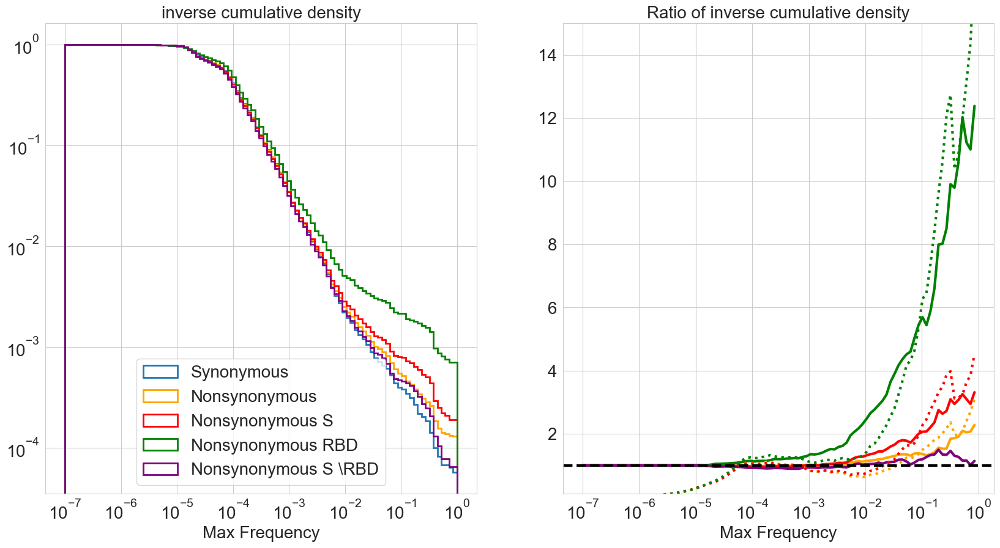

In [16]:
fig, ax = plt.subplots(1,2,figsize = (20,10))

syn_h,syn_b,syn_p = ax[0].hist(syn_clade_stats['Max_Freq'], bins = np.logspace(-7,0,100), density = True, alpha = 1, lw=2, label = 'Synonymous',cumulative=-1, histtype = 'step')

nonsyn_all_h,nonsyn_all_b,nonsyn_all_p = ax[0].hist(nonsyn_all_clade_stats['Max_Freq'], bins = np.logspace(-7,0,100), density = True, alpha = 1, lw=2, label = 'Nonsynonymous',cumulative=-1, histtype = 'step',color='orange')

nonsyn_S_h,nonsyn_S_b,nonsyn_S_p = ax[0].hist(nonsyn_S_clade_stats['Max_Freq'], bins = np.logspace(-7,0,100), density = True, alpha = 1, lw=2, label = 'Nonsynonymous S',cumulative=-1, histtype = 'step',color='red')

nonsyn_RBD_h,nonsyn_RBD_b,nonsyn_RBD_p = ax[0].hist(nonsyn_RBD_clade_stats['Max_Freq'], bins = np.logspace(-7,0,100), density = True, alpha = 1, lw=2, label = 'Nonsynonymous RBD',cumulative=-1, histtype = 'step',color='green')

nonsyn_S_minus_RBD_h, nonsyn_S_minus_RBD_b, nonsyn_S_minus_RBD_p = ax[0].hist(nonsyn_S_minus_RBD_clade_stats['Max_Freq'], bins = np.logspace(-7,0,100), density = True, alpha = 1, lw=2, label = 'Nonsynonymous S \RBD',cumulative=-1, histtype = 'step',color='purple')

#fit syn with b/(1+a x)
fitfunc = lambda x,a,b: b/(1+a*x)
popt, pcov = so.curve_fit(fitfunc, syn_b[50:-1],syn_h[50:])
a,b = popt
one_over_x_fit = fitfunc(syn_b[:-1],a,b)
# ax[0].plot(syn_b[:-1],one_over_x_fit, label = r'$1/x$',color='steelblue',linestyle='--')
ax[0].legend(loc='best',fontsize=20)
ax[1].plot(syn_b[:-1],nonsyn_all_h/syn_h, label = 'Synonymous',color='orange')
ax[1].plot(syn_b[:-1],nonsyn_S_h/syn_h, label = 'Nonsynonymous S',color='red')
ax[1].plot(syn_b[:-1],nonsyn_RBD_h/syn_h, label = 'Nonsynonymous RBD',color='green')
ax[1].plot(syn_b[:-1],nonsyn_S_minus_RBD_h/syn_h, label = 'Nonsynonymous S \RBD',color='purple')

ax[1].plot(syn_b[:-1],nonsyn_all_h/one_over_x_fit,color='orange',ls= ':')
ax[1].plot(syn_b[:-1],nonsyn_S_h/one_over_x_fit,color='red',ls= ':')
ax[1].plot(syn_b[:-1],nonsyn_RBD_h/one_over_x_fit,color='green',ls= ':')

print(f'x such that ratio>2 for nonsyn all: {syn_b[np.argwhere(nonsyn_all_h/one_over_x_fit>2)[0][0]]:.2e}')
print(f'x such that ratio>2 for nonsyn S: {syn_b[np.argwhere(nonsyn_S_h/one_over_x_fit>2)[0][0]]:.2e}')
print(f'x such that ratio>2 for nonsyn RBD: {syn_b[np.argwhere(nonsyn_RBD_h/one_over_x_fit>2)[0][0]]:.2e}')

ax[1].set_ylim(.1,15)

ax[1].axhline(1,linestyle='--',color='black')

ax[0].set_xscale('log')
ax[0].set_yscale('log')
# ax[0].set_ylim(10,50)

ax[1].set_xscale('log')

ax[0].set_xlabel('Max Frequency',fontsize=20)
ax[0].set_title('inverse cumulative density',fontsize=20)

ax[1].set_xlabel('Max Frequency',fontsize=20)
ax[1].set_title('Ratio of inverse cumulative density',fontsize=20)
for a in ax:
    a.tick_params(axis='both', which='major', labelsize=20)


In [17]:
34*.4        

13.600000000000001

In [18]:
reference_date = pd.to_datetime('2020-01-01')

syn_clade_stats['day_diff'] = (pd.to_datetime(syn_clade_stats['Orig_Time']) - reference_date).dt.days
nonsyn_all_clade_stats['day_diff'] = (pd.to_datetime(nonsyn_all_clade_stats['Orig_Time']) - reference_date).dt.days
nonsyn_S_clade_stats['day_diff'] = (pd.to_datetime(nonsyn_S_clade_stats['Orig_Time']) - reference_date).dt.days
nonsyn_RBD_clade_stats['day_diff'] = (pd.to_datetime(nonsyn_RBD_clade_stats['Orig_Time']) - reference_date).dt.days

In [19]:
4*(1/2)/1.5

1.3333333333333333

In [20]:
World_cases = 7*covid_data_World['new_cases_smoothed']
World_cases = World_cases[World_cases>0]
World_cases = World_cases[~np.isinf(World_cases)]
World_cases = World_cases[~np.isnan(World_cases)]


covid_data_World['Time_datetime'] = pd.to_datetime(covid_data_World['date'])
covid_data_World['day_diff'] = covid_data_World['Time_datetime']-reference_date

covid_data_World['day_diff'] = covid_data_World['day_diff'].apply(lambda x: x.days)
covid_data_World['weekly_new_cases_smoothed'] = covid_data_World['new_cases_smoothed']*7

(-97.95, 1352.95, -2211809.2479000003, 46448038.2499)

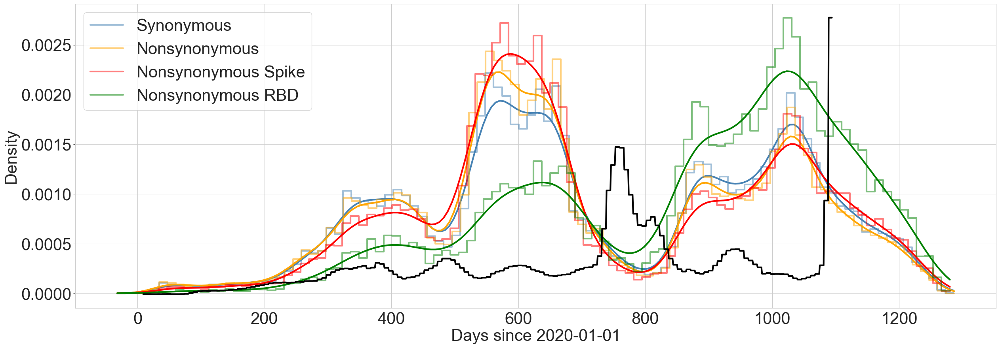

In [21]:
fig,ax = plt.subplots(1,figsize = (30,10))
sns.histplot(syn_clade_stats['day_diff']
             ,bins = 100, label = 'Synonymous',alpha=.5, stat = 'density',color='steelblue',ax=ax,element='step', fill=False,kde=True)

sns.histplot(nonsyn_all_clade_stats['day_diff']
             ,bins = 100, label = 'Nonsynonymous',alpha=.5, stat = 'density',color='orange',ax=ax,element='step', fill=False,kde=True)

sns.histplot(nonsyn_S_clade_stats['day_diff']
             ,bins = 100, label = 'Nonsynonymous Spike',alpha=.5, stat = 'density',color='red',ax=ax,element='step', fill=False,kde=True)

sns.histplot(nonsyn_RBD_clade_stats['day_diff']
                ,bins = 100, label = 'Nonsynonymous RBD',alpha=.5, stat = 'density',color='green',ax=ax,element='step', fill=False,kde=True)

ax.set_ylim(bottom=-(ax.get_ylim()[1])*.05)
tax= ax.twinx()
sns.lineplot(data = covid_data_World, x = 'day_diff', y = 'weekly_new_cases_smoothed', ax = tax ,color='black')

ax.set_xlabel('Days since 2020-01-01',fontsize=30)
ax.set_ylabel('Density',fontsize=30)
tax.set_ylabel('Weekly new cases',fontsize=30)

ax.legend(loc='upper left',fontsize=30)

tax.axis('off')


In [22]:
wt_alpha_crossover_date = pd.to_datetime('2021-03-15')
alpha_delta_crossover_date = pd.to_datetime('2021-06-21')
delta_ba1_crossover_date = pd.to_datetime('2022-01-03')
ba1_ba2_crossover_date = pd.to_datetime('2022-01-31')
ba2_ba5_crossover_date = pd.to_datetime('2022-06-06')
ba5_xbb_crossover_date = pd.to_datetime('2023-02-27')

wt_alpha_crossover_label = 'WT to Alpha'
alpha_delta_crossover_label = 'Alpha to Delta'
delta_ba1_crossover_label = 'Delta to BA.1'
ba1_ba2_crossover_label = 'BA.1 to BA.2'
ba2_ba5_crossover_label = 'BA.2 to BA.5'
ba5_xbb_crossover_label = 'BA.5 to xBB'

crossover_dates = [alpha_delta_crossover_date,delta_ba1_crossover_date,ba2_ba5_crossover_date]
crossover_labels = [alpha_delta_crossover_label,delta_ba1_crossover_label,ba2_ba5_crossover_label]

In [23]:
day_diff_weekly = covid_data_World['day_diff'][::7]

In [24]:
reference_date = pd.to_datetime('2020-01-01')
syn_clade_statistics_SARS_CoV_2_World['day_diff'] = (pd.to_datetime(syn_clade_statistics_SARS_CoV_2_World['Time']) - reference_date).dt.days
nonsyn_all_clade_statistics_SARS_CoV_2_World['day_diff'] = (pd.to_datetime(nonsyn_all_clade_statistics_SARS_CoV_2_World['Time']) - reference_date).dt.days
nonsyn_S_clade_statistics_SARS_CoV_2_World['day_diff'] = (pd.to_datetime(nonsyn_S_clade_statistics_SARS_CoV_2_World['Time']) - reference_date).dt.days
nonsyn_RBD_clade_statistics_SARS_CoV_2_World['day_diff'] = (pd.to_datetime(nonsyn_RBD_clade_statistics_SARS_CoV_2_World['Time']) - reference_date).dt.days

def initial_growth(clade, df, min_freq = 1e-4):
    # Query once and select only the required columns
    subset = df[df['Clade'] == clade][['day_diff', 'Sublineage_Freq']].values
    subset = subset[subset[:,0].argsort()]
    x = subset[:,0]
    y = subset[:,1]

    x= x[y>min_freq]
    y= y[y>min_freq]
    
    if len(x)>=10:
        g_rate = np.average(np.log(y[1:10] / y[:9]) / (x[1:10] - x[:9]))
    else:
        g_rate = np.average(np.log(y[1:] / y[:-1]) / (x[1:] - x[:-1]))
    # print(g_rate)
    return g_rate


In [25]:
sum_freqs_syn = syn_clade_statistics_SARS_CoV_2_World.groupby('day_diff')['Clade_Freq'].sum()
sum_freqs_nonsyn_RBD = nonsyn_RBD_clade_statistics_SARS_CoV_2_World.groupby('day_diff')['Clade_Freq'].sum()


entropies_nonsyn_RBD = nonsyn_RBD_clade_statistics_SARS_CoV_2_World.groupby('day_diff')['Clade_Freq'].apply(lambda x: -np.sum(x*np.log(x)))
entropies_syn = syn_clade_statistics_SARS_CoV_2_World.groupby('day_diff')['Clade_Freq'].apply(lambda x: -np.sum(x*np.log(x)))

/Users/dennytrimcev/miniconda3/envs/paper_transition/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [26]:
entropies_nonsyn_RBD = nonsyn_RBD_clade_statistics_SARS_CoV_2_World.groupby('day_diff')['Clade_Freq'].apply(lambda x: -np.sum(x*np.log(x)))
#make a dataframe out of it
entropies_nonsyn_RBD = pd.DataFrame(entropies_nonsyn_RBD)
print(entropies_nonsyn_RBD)
entropies_nonsyn_RBD.reset_index(inplace=True)
print(entropies_nonsyn_RBD.rename(columns = {'Clade_Freq':'entropy'},inplace=True))
print(entropies_nonsyn_RBD)
# entropies_nonsyn_RBD.reset_index(inplace=True)
# entropies_nonsyn_RBD

            Clade_Freq
day_diff              
-32      -0.000000e+00
-31      -0.000000e+00
-30      -3.108624e-15
-29       7.771561e-16
-28       5.551115e-16
...                ...
 1367    -8.881784e-16
 1368    -1.554312e-15
 1369    -0.000000e+00
 1370    -3.108624e-15
 1371    -0.000000e+00

[1404 rows x 1 columns]
None
      day_diff       entropy
0          -32 -0.000000e+00
1          -31 -0.000000e+00
2          -30 -3.108624e-15
3          -29  7.771561e-16
4          -28  5.551115e-16
...        ...           ...
1399      1367 -8.881784e-16
1400      1368 -1.554312e-15
1401      1369 -0.000000e+00
1402      1370 -3.108624e-15
1403      1371 -0.000000e+00

[1404 rows x 2 columns]


In [27]:
entropies_nonsyn_RBD

,day_diff,entropy
0,-32,-0.000000e+00
1,-31,-0.000000e+00
2,-30,-3.108624e-15
3,-29,7.771561e-16
4,-28,5.551115e-16
...,...,...
1399,1367,-8.881784e-16
1400,1368,-1.554312e-15
1401,1369,-0.000000e+00
1402,1370,-3.108624e-15


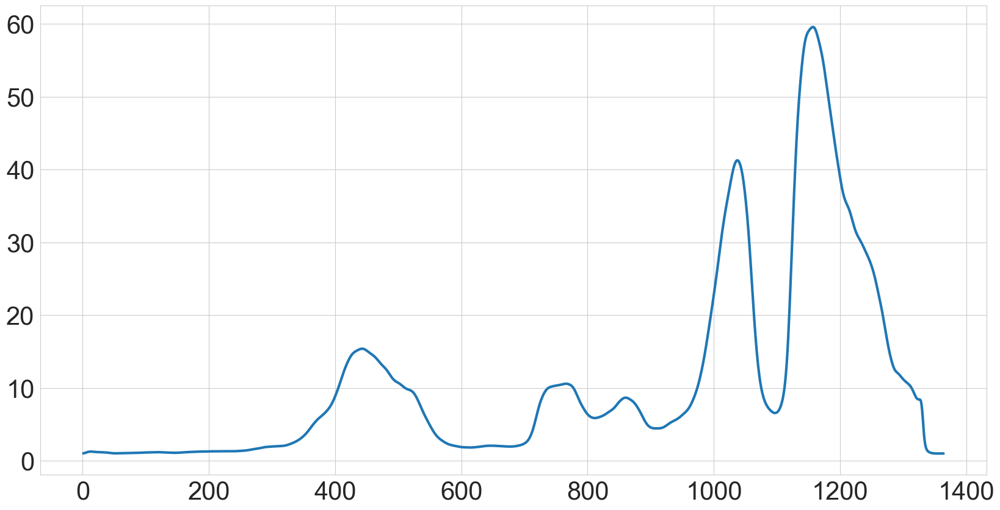

In [28]:
entropies_nonsyn_RBD = entropies_nonsyn_RBD[entropies_nonsyn_RBD>0]
plt.plot(entropies_nonsyn_RBD.day_diff,np.exp(entropies_nonsyn_RBD.entropy))
# plt.plot(entropies_syn)

# plt.plot(sum_freqs_syn)
# plt.plot(sum_freqs_nonsyn_RBD,ls= '--')

In [29]:
import warnings
warnings.filterwarnings('ignore')

In [30]:
covid_data = pd.read_csv(os.getcwd()+'/data/covid_data.csv')
covid_data_World  = covid_data[covid_data['location'] == 'World'].query(f'date < "{last_date}"')

In [31]:

World_cases = 7*covid_data_World['new_cases_smoothed']
World_cases = World_cases[World_cases>0]
World_cases = World_cases[~np.isinf(World_cases)]
World_cases = World_cases[~np.isnan(World_cases)]


covid_data_World['Time_datetime'] = pd.to_datetime(covid_data_World['date'])
covid_data_World['day_diff'] = covid_data_World['Time_datetime']-reference_date

covid_data_World['day_diff'] = covid_data_World['day_diff'].apply(lambda x: x.days)
covid_data_World['weekly_new_cases_smoothed'] = covid_data_World['new_cases_smoothed']*7

I_over_time = covid_data_World['weekly_new_cases_smoothed'].values

In [32]:
# avg_max_x_by_s = nonsyn_S_clade_stats.groupby('s_w')['Max_Freq'].mean().dropna().rolling(10).mean()
# s_w_vals = avg_max_x_by_s.index


In [33]:
#import savgol_filter
from scipy.signal import savgol_filter
#import gaussian smoothing
from scipy.ndimage import gaussian_filter1d

# avg_max_x_by_s_smooth = gaussian_filter1d(avg_max_x_by_s, sigma=2)

In [34]:
# s_w_vals = s_w_vals[~np.isnan(avg_max_x_by_s_smooth)]
# avg_max_x_by_s_smooth = avg_max_x_by_s_smooth[~np.isnan(avg_max_x_by_s_smooth)]


In [35]:
# df_pot_selection  = pd.read_csv('data/df_pot_selection.txt',sep = '\t')
fitness_france = pd.read_csv('data/fitness_France_newest.txt',sep = '\t')
# fitness_france_new = pd.read_csv('data/fitness_France_new.txt',sep = '\t')

In [36]:
fitness_france['day_diff'] = (pd.to_datetime(fitness_france['date']) - reference_date).dt.days
fitness_france['s_w'] = fitness_france['av_pot_selection']*7

# fitness_france_new['day_diff'] = (pd.to_datetime(fitness_france_new['date']) - reference_date).dt.days
# fitness_france_new['s_w'] = fitness_france_new['av_pot_selection']*7

Text(0.5, 0, 'Time, Days since 2020-01-01')

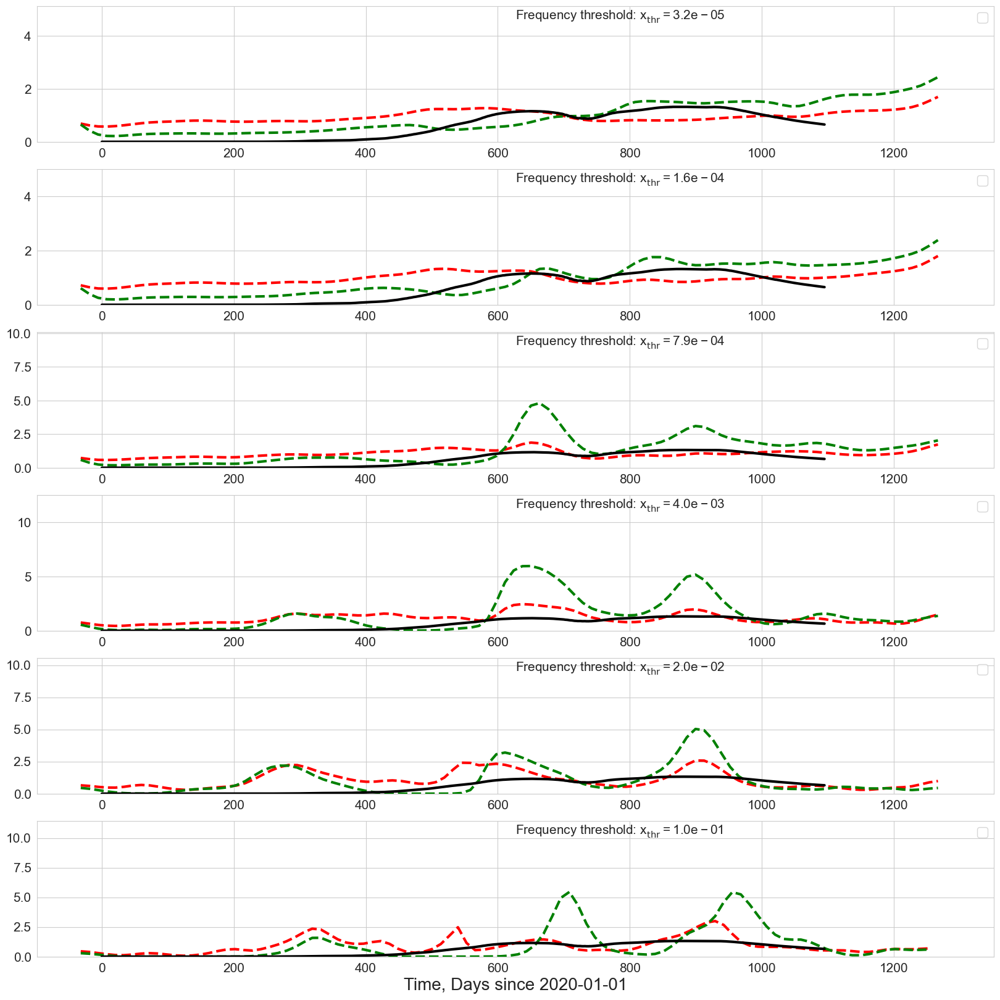

In [37]:
n_vals = 6
x_thresh_vals = np.logspace(-4.5,-1,n_vals)
fig,ax= plt.subplots(n_vals,1,figsize = (20,20))

for i,x_thresh in enumerate(x_thresh_vals):

    h_syn,b_syn,p_syn = ax[i].hist(syn_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'],bins = 100, lw=2, histtype = 'step',color='steelblue',alpha=0)
    tot_counts_syn = len(syn_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'])


    h_nonsyn_S,b_nonsyn_S,p_nonsyn_S = ax[i].hist(nonsyn_S_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'],bins = 100, lw=2, histtype = 'step',color='orange',alpha=0)
    h_nonsyn_RBD,b_nonsyn_RBD,p_nonsyn_RBD = ax[i].hist(nonsyn_RBD_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'],bins = 100, lw=2, histtype = 'step',color='orange',alpha=0)

    tot_counts_nonsyn_S = len(nonsyn_S_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'])
    tot_counts_nonsyn_RBD = len(nonsyn_RBD_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'])

    h_smoothed_syn = gaussian_filter1d(h_syn, sigma=2)/tot_counts_syn
    # ax[i].plot(b_syn[:-1],h_smoothed_syn, label = 'Synonymous',color='steelblue',linestyle='--')
    h_smoothed_nonsyn_S = gaussian_filter1d(h_nonsyn_S, sigma=2)/tot_counts_nonsyn_S
    h_smoothed_nonsyn_RBD = gaussian_filter1d(h_nonsyn_RBD, sigma=2)/tot_counts_nonsyn_RBD



    ax[i].plot(b_nonsyn_S[:-1],h_smoothed_nonsyn_S/h_smoothed_syn, label = 'Nonsynonymous Spike',color='Red',linestyle='--')
    ax[i].plot(b_nonsyn_S[:-1],h_smoothed_nonsyn_RBD/h_smoothed_syn, label = 'Nonsynonymous RBD',color='green',linestyle='--')

    max_y_val = np.max(((h_smoothed_nonsyn_S/h_smoothed_syn) [h_smoothed_syn>0], (h_smoothed_nonsyn_RBD/h_smoothed_syn) [ h_smoothed_syn>0]))
    # ax[i].grid(False)
    ax[i].set_ylim(0,np.min((max_y_val*2.1,20)))
    # ax[i].legend(loc='best',fontsize=20)
    # ax[i].set_title(f'Frequency threshold: $x_\mathrm{{thr}}= {x_thresh:.1e}$',fontsize=15)
    ax[i].annotate(f'Frequency threshold: $x_\mathrm{{thr}}= {x_thresh:.1e}$', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=15,)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    xlim = ax[i].get_xlim()
    # tax = ax[i].twinx()
    sns.lineplot(data = fitness_france, x = 'day_diff', y = 's_w', ax = ax[i] ,color='black')
    # handles =[
    #     Line2D([0], [0], color='red', lw=4, label='Nonsynonymous Spike'),
    #     Line2D([0], [0], color='green', lw=4, label='Nonsynonymous RBD'),
    #     Line2D([0], [0], color='black', lw=4, label='Selection')
    # ]
    ax[i].legend('',loc='best',fontsize=15)
    ax[i].set_xlabel('')
    ax[i].set_ylabel('',fontsize=15)

    # tax.set_xlim(xlim)
    # tax.tick_params(axis='both', which='major', labelsize=15)
    # tax.grid(False)
    # tax.set_ylabel('Average selection',fontsize=15)
    

ax[-1].set_xlabel('Time, Days since 2020-01-01',fontsize=20)

Text(0.5, 0, 'Time, Days since 2020-01-01')

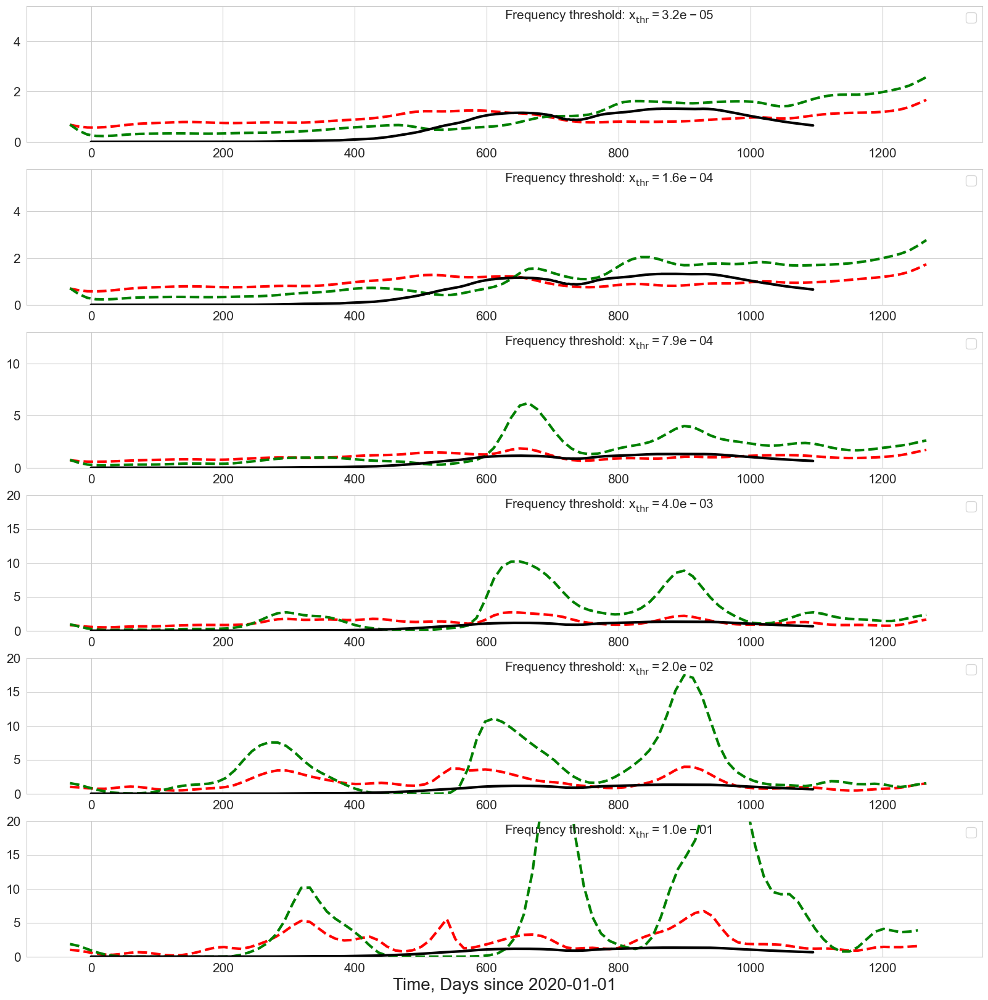

In [38]:
n_vals = 6
x_thresh_vals = np.logspace(-4.5,-1,n_vals)
fig,ax= plt.subplots(n_vals,1,figsize = (20,20))

for i,x_thresh in enumerate(x_thresh_vals):

    h_syn,b_syn,p_syn = ax[i].hist(syn_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'],bins = 100, lw=2, histtype = 'step',color='steelblue',alpha=0)
    tot_counts_syn = len(syn_clade_stats['day_diff'])


    h_nonsyn_S,b_nonsyn_S,p_nonsyn_S = ax[i].hist(nonsyn_S_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'],bins = 100, lw=2, histtype = 'step',color='orange',alpha=0)
    h_nonsyn_RBD,b_nonsyn_RBD,p_nonsyn_RBD = ax[i].hist(nonsyn_RBD_clade_stats.query(f'Max_Freq >{x_thresh}')['day_diff'],bins = 100, lw=2, histtype = 'step',color='orange',alpha=0)

    tot_counts_nonsyn_S = len(nonsyn_S_clade_stats['day_diff'])
    tot_counts_nonsyn_RBD = len(nonsyn_RBD_clade_stats['day_diff'])

    h_smoothed_syn = gaussian_filter1d(h_syn, sigma=2)/tot_counts_syn
    # ax[i].plot(b_syn[:-1],h_smoothed_syn, label = 'Synonymous',color='steelblue',linestyle='--')
    h_smoothed_nonsyn_S = gaussian_filter1d(h_nonsyn_S, sigma=2)/tot_counts_nonsyn_S
    h_smoothed_nonsyn_RBD = gaussian_filter1d(h_nonsyn_RBD, sigma=2)/tot_counts_nonsyn_RBD



    ax[i].plot(b_nonsyn_S[:-1],h_smoothed_nonsyn_S/h_smoothed_syn, label = 'Nonsynonymous Spike',color='Red',linestyle='--')
    ax[i].plot(b_nonsyn_S[:-1],h_smoothed_nonsyn_RBD/h_smoothed_syn, label = 'Nonsynonymous RBD',color='green',linestyle='--')

    max_y_val = np.max(((h_smoothed_nonsyn_S/h_smoothed_syn) [h_smoothed_syn>0], (h_smoothed_nonsyn_RBD/h_smoothed_syn) [ h_smoothed_syn>0]))
    # ax[i].grid(False)
    ax[i].set_ylim(0,np.min((max_y_val*2.1,20)))
    # ax[i].legend(loc='best',fontsize=20)
    # ax[i].set_title(f'Frequency threshold: $x_\mathrm{{thr}}= {x_thresh:.1e}$',fontsize=15)
    ax[i].annotate(f'Frequency threshold: $x_\mathrm{{thr}}= {x_thresh:.1e}$', xy=(0.5, 0.9), xycoords='axes fraction', fontsize=15,)
    ax[i].tick_params(axis='both', which='major', labelsize=15)
    xlim = ax[i].get_xlim()
    # tax = ax[i].twinx()
    sns.lineplot(data = fitness_france, x = 'day_diff', y = 's_w', ax = ax[i] ,color='black')
    # handles =[
    #     Line2D([0], [0], color='red', lw=4, label='Nonsynonymous Spike'),
    #     Line2D([0], [0], color='green', lw=4, label='Nonsynonymous RBD'),
    #     Line2D([0], [0], color='black', lw=4, label='Selection')
    # ]
    ax[i].legend('',loc='best',fontsize=15)
    ax[i].set_xlabel('')
    ax[i].set_ylabel('',fontsize=15)

    # tax.set_xlim(xlim)
    # tax.tick_params(axis='both', which='major', labelsize=15)
    # tax.grid(False)
    # tax.set_ylabel('Average selection',fontsize=15)
    

ax[-1].set_xlabel('Time, Days since 2020-01-01',fontsize=20)

In [39]:
cases = 7*covid_data_World['new_cases_smoothed'].values
len(cases)

1091

In [41]:
# avg_pot_selection_old = fitness_france['av_pot_selection'].values[5:]
avg_pot_selection = fitness_france['av_pot_selection'].values[5:]
len(avg_pot_selection)

day_diff = fitness_france['day_diff'][5:].values
print(len(day_diff),len(avg_pot_selection))

1091 1091


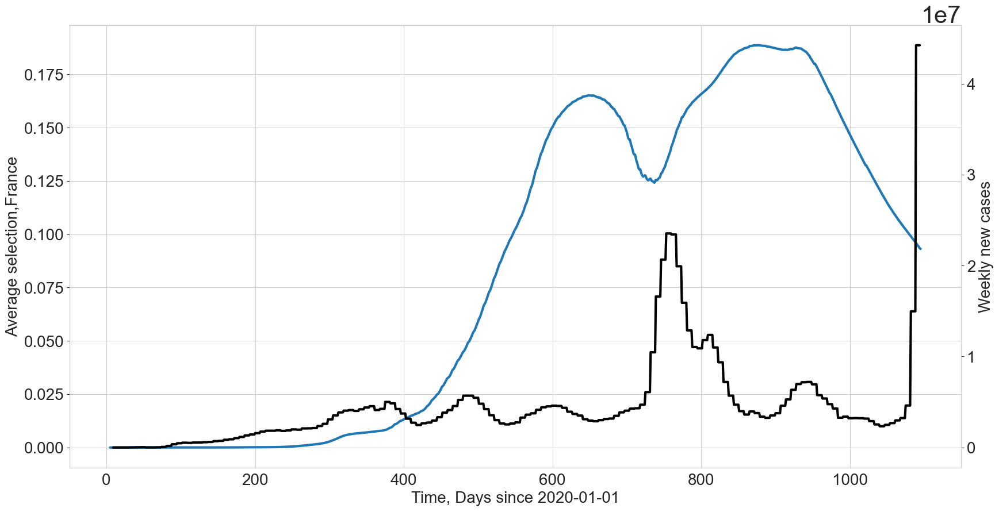

In [43]:
fig,ax= plt.subplots(1,figsize = (20,10))


ax.plot(fitness_france['day_diff'][5:],avg_pot_selection)

tax = ax.twinx()
tax.plot(covid_data_World['day_diff'],cases,color='black')
tax.grid(False)
ax.set_xlabel('Time, Days since 2020-01-01',fontsize=20)
ax.set_ylabel('Average selection,France',fontsize=20)
tax.set_ylabel('Weekly new cases',fontsize=20)

ax.tick_params(axis='both', which='major', labelsize=20)
tax.tick_params(axis='both', which='major', labelsize=20)

Text(0.5, 0, 'Time, Days since 2020-01-01')

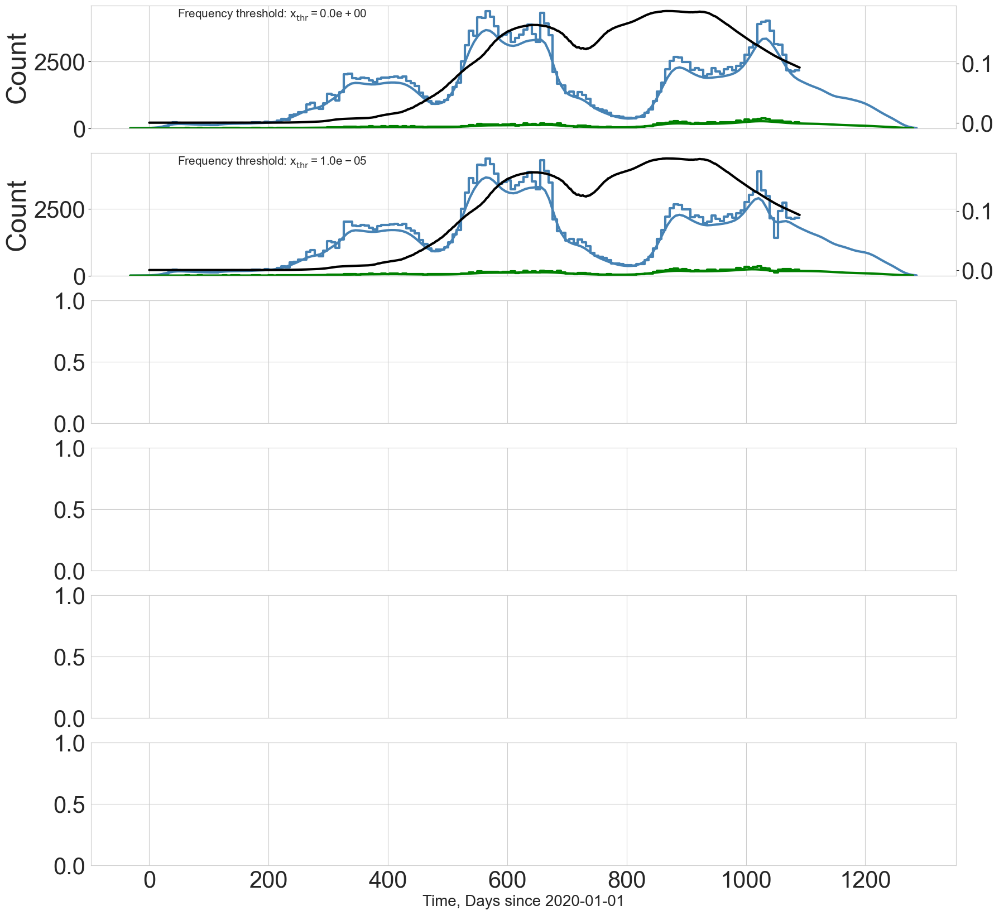

In [44]:
# fig,ax = plt.subplots(1,figsize = (20,10))
fig,ax= plt.subplots(n_vals,1,figsize = (20,20),sharex=True)

for i,x_thresh in enumerate([0,1e-5]):
    sns.histplot(syn_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'Synonymous',alpha=1, color='steelblue',ax=ax[i],element='step', fill=False,kde=True, kde_kws={'bw_adjust':.5}, stat='count', )
    sns.histplot(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'RBD',alpha=1, color='green',ax=ax[i],element='step', fill=False,kde=True, kde_kws={'bw_adjust':.5}, stat='count', )
    # ax.plot(1e-5*cases*avg_pot_selection ,color='black',label='Cases x Selection')
    # sns.histplot(syn_clade_stats['day_diff'],bins = day_diff_weekly, label = 'Synonymous',alpha=.5,color='steelblue',ax=ax,element='step', fill=False,kde=True)
    # sns.histplot(nonsyn_all_clade_stats['day_diff'],bins = day_diff_weekly, label = 'Nonsynonymous',alpha=.5,color='orange',ax=ax,element='step', fill=False,kde=True)
    # sns.histplot(nonsyn_S_clade_stats.query(f' Max_Freq> {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'Nonsynonymous Spike',alpha=.5,color='red',ax=ax[i],element='step', fill=False,kde=True)
    # sns.histplot(nonsyn_RBD_clade_stats.query(f' Max_Freq> {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'Nonsynonymous RBD',alpha=.5,color='green',ax=ax[i],element='step', fill=False,kde=True)
    ax[i].annotate(f'Frequency threshold: $x_\mathrm{{thr}}= {x_thresh:.1e}$', xy=(0.1, 0.9), xycoords='axes fraction', fontsize=15,)
    tax = ax[i].twinx()
    # ax[i].set_xticklabels([])
    tax.grid(False)
    tax.plot(avg_pot_selection ,color='black',label='Cases x Selection')

ax[-1].set_xlabel('Time, Days since 2020-01-01',fontsize=20)

Text(0.5, 0, 'Time, Days since 2020-01-01')

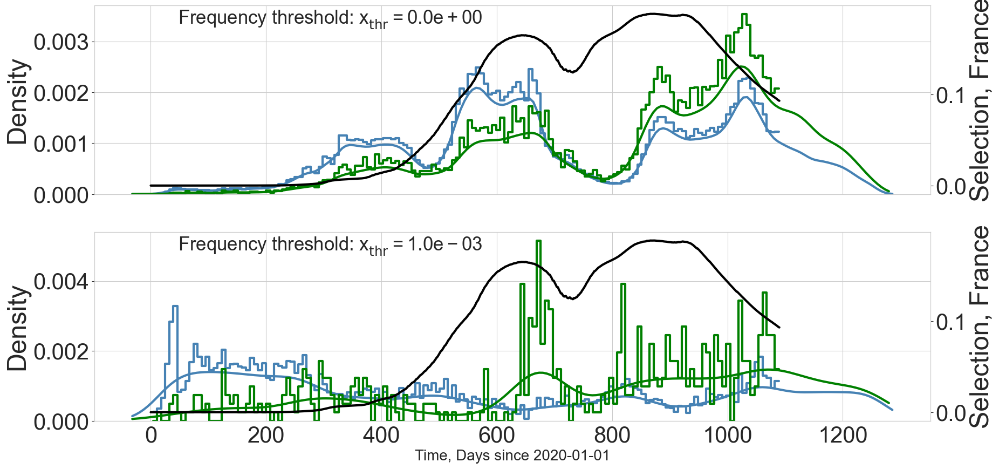

In [45]:
# fig,ax = plt.subplots(1,figsize = (20,10))
fig,ax= plt.subplots(2,1,figsize = (20,10),sharex=True)

for i,x_thresh in enumerate([0,1e-3]):
    sns.histplot(syn_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'Synonymous',alpha=1, color='steelblue',ax=ax[i],element='step', fill=False,kde=True, kde_kws={'bw_adjust':.5}, stat='density', )
    sns.histplot(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'RBD',alpha=1, color='green',ax=ax[i],element='step', fill=False,kde=True, kde_kws={'bw_adjust':.5}, stat='density', )

    ax[i].annotate(f'Frequency threshold: $x_\mathrm{{thr}}= {x_thresh:.1e}$', xy=(0.1, 0.9), xycoords='axes fraction', fontsize=25,)
    tax = ax[i].twinx()
    # ax[i].set_xticklabels([])
    tax.grid(False)
    tax.plot(avg_pot_selection ,color='black')
    tax.set_ylabel('Selection, France')

ax[-1].set_xlabel('Time, Days since 2020-01-01',fontsize=20)

In [46]:
h_syn_dict = {}
b_syn_dict = {}

h_nonsyn_RBD_dict, b_nonsyn_RBD_dict = {},{}
for x_thresh in x_thresh_vals:
    h_syn, b_syn = np.histogram(syn_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, density= False)
    h_nonsyn_RBD, b_nonsyn_RBD = np.histogram(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, density= False)

    h_syn_dict[x_thresh] = h_syn
    b_syn_dict[x_thresh] = b_syn

    h_nonsyn_RBD_dict[x_thresh] = h_nonsyn_RBD    
    b_nonsyn_RBD_dict[x_thresh] = b_nonsyn_RBD




In [47]:
x_thresh_vals

array([3.16227766e-05, 1.58489319e-04, 7.94328235e-04, 3.98107171e-03,
       1.99526231e-02, 1.00000000e-01])

In [48]:
x_thresh_vals

array([3.16227766e-05, 1.58489319e-04, 7.94328235e-04, 3.98107171e-03,
       1.99526231e-02, 1.00000000e-01])

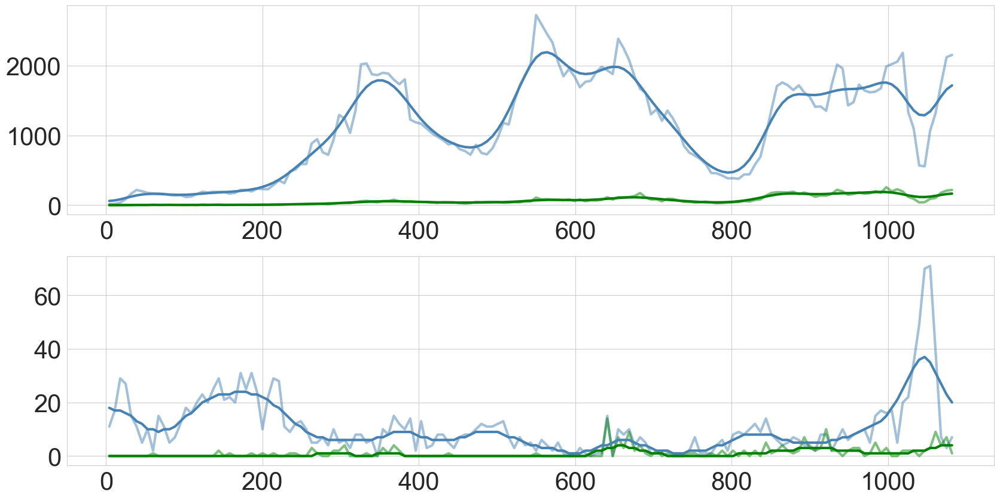

In [49]:
from scipy.ndimage import gaussian_filter1d

sigma_smoothing = 3

fig,axs = plt.subplots(2,1,)
h0_nonsyn_RBD = h_nonsyn_RBD_dict[x_thresh_vals[0]]
h0_syn = h_syn_dict[x_thresh_vals[0]]

smoothed_h0_nonsyn_RBD = gaussian_filter1d(h0_nonsyn_RBD, sigma=sigma_smoothing)
smoothed_h0_syn = gaussian_filter1d(h0_syn, sigma=sigma_smoothing)

axs[0].plot(day_diff_weekly[:-1],h0_syn,color='steelblue',alpha=.5)
axs[0].plot(day_diff_weekly[:-1],h0_nonsyn_RBD,color='green',alpha=.5)

axs[0].plot(day_diff_weekly[:-1],smoothed_h0_syn,color='steelblue')
axs[0].plot(day_diff_weekly[:-1],smoothed_h0_nonsyn_RBD,color='green')

hm3_nonsyn_RBD = h_nonsyn_RBD_dict[x_thresh_vals[-3]]
hm3_syn = h_syn_dict[x_thresh_vals[-3]]

smoothed_hm3_nonsyn_RBD = gaussian_filter1d(hm3_nonsyn_RBD, sigma=sigma_smoothing)
smoothed_hm3_syn = gaussian_filter1d(hm3_syn, sigma=sigma_smoothing)

axs[1].plot(day_diff_weekly[:-1],hm3_syn,color='steelblue',alpha=.5)
axs[1].plot(day_diff_weekly[:-1],hm3_nonsyn_RBD,color='green',alpha=.5)

axs[1].plot(day_diff_weekly[:-1],smoothed_hm3_syn,color='steelblue')
axs[1].plot(day_diff_weekly[:-1],smoothed_hm3_nonsyn_RBD,color='green')

In [50]:
x_thresh_vals = np.array([0,1e-5,1e-4,1e-3,1e-2,1e-1])

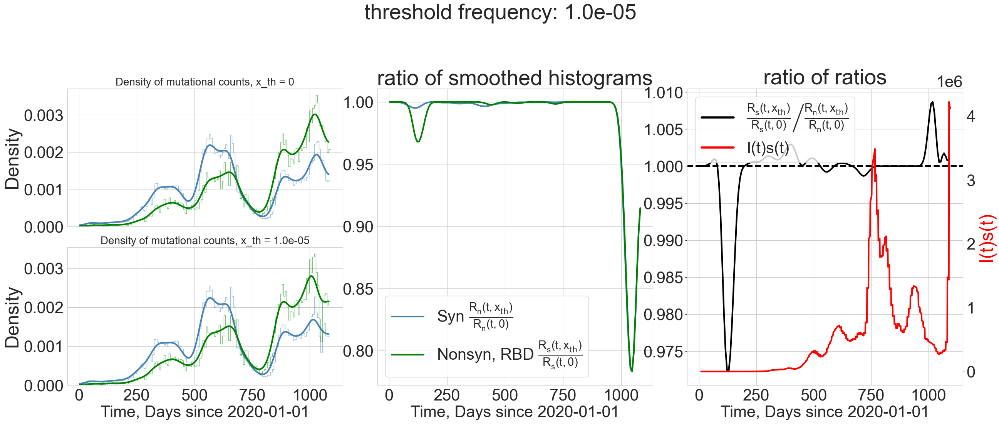

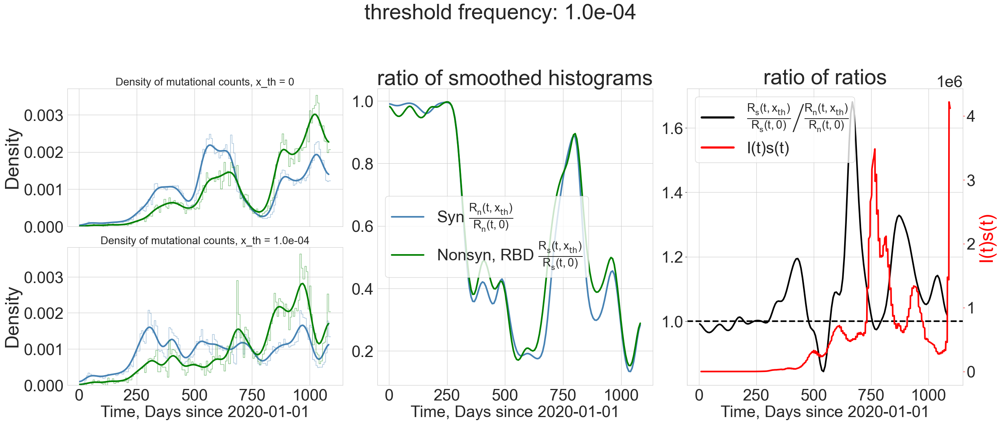

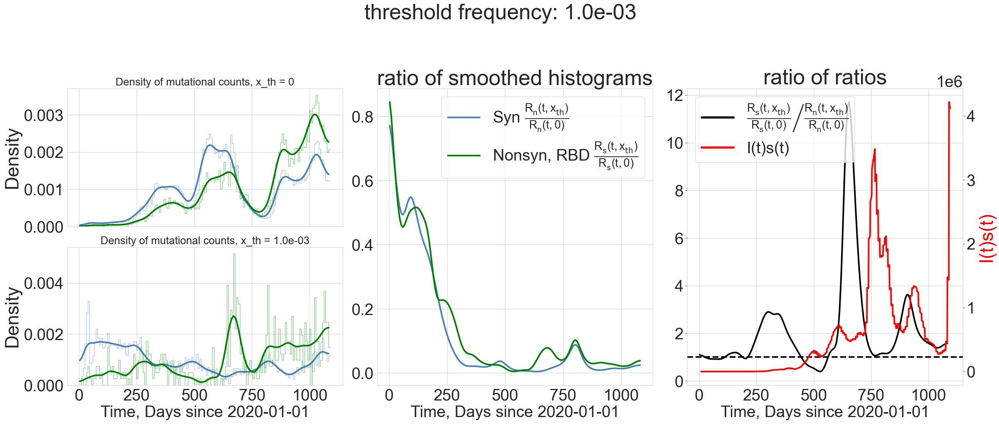

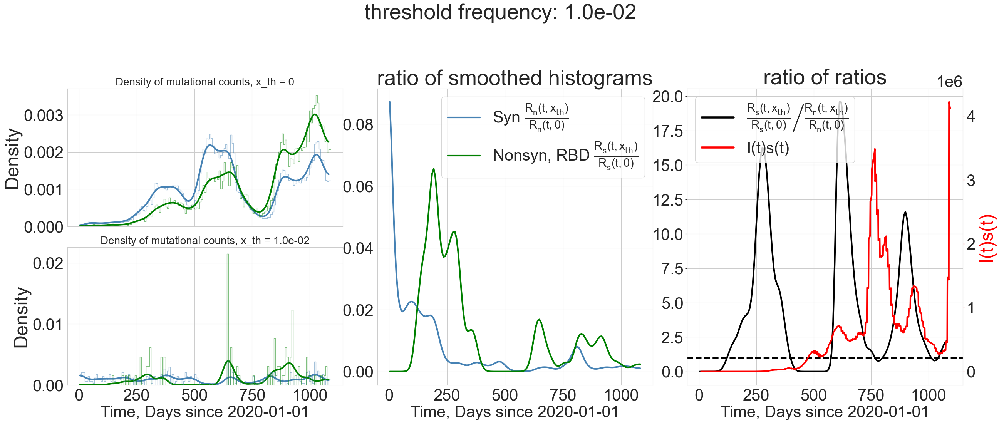

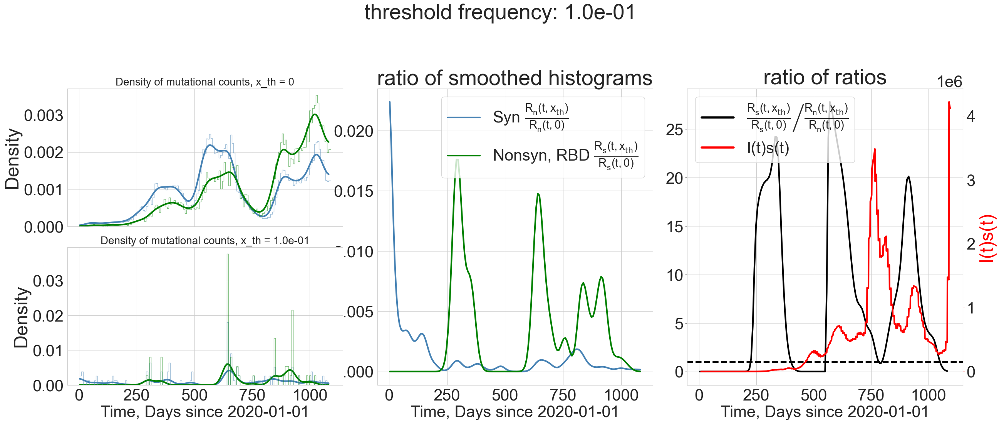

In [56]:
sigma_smoothing = 3

figure_mosaic = """
    AAACCCDDD
    BBBCCCDDD
    """

hist_ts = day_diff_weekly[:-1]

for x_thresh in x_thresh_vals[1:]:
    fig,axes = plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(30,10))
    plt.subplots_adjust(wspace=.5,hspace=.15)

    h0_syn, b0_syn = np.histogram(syn_clade_stats.query(f'Max_Freq > {0}')['day_diff'],bins = day_diff_weekly, density= False)
    hx_syn, bx_syn = np.histogram(syn_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, density= False)

    h0_nonsyn_RBD, b0_nonsyn_RBD = np.histogram(nonsyn_RBD_clade_stats.query(f'Max_Freq > {0}')['day_diff'],bins = day_diff_weekly, density= False)
    
    hx_nonsyn_RBD, bx_nonsyn_RBD = np.histogram(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, density= False)

    ratio_nonsyn_RBD = hx_nonsyn_RBD/h0_nonsyn_RBD
    ratio_syn = hx_syn/h0_syn

    smoothed_h0_syn = gaussian_filter1d(h0_syn.astype('float'), sigma = sigma_smoothing)
    smoothed_hx_syn = gaussian_filter1d(hx_syn.astype('float'), sigma = sigma_smoothing)

    smoothed_h0_nonsyn_RBD = gaussian_filter1d(h0_nonsyn_RBD.astype('float'),sigma=sigma_smoothing)
    smoothed_hx_nonsyn_RBD = gaussian_filter1d(hx_nonsyn_RBD.astype('float'),sigma=sigma_smoothing)

    smoothed_ratio_nonsyn_RBD = smoothed_hx_nonsyn_RBD/smoothed_h0_nonsyn_RBD
    smoothed_ratio_syn = smoothed_hx_syn/smoothed_h0_syn

    ax_densities_0 = axes['A']
    ax_densities_x_thresh = axes['B']

    ax_densities_0.plot(hist_ts, smoothed_h0_syn/np.trapz(smoothed_h0_syn,hist_ts),color='steelblue')
    ax_densities_0.plot(hist_ts, smoothed_h0_nonsyn_RBD/np.trapz(smoothed_h0_nonsyn_RBD,hist_ts),color='green')

    ax_densities_x_thresh.plot(hist_ts, smoothed_hx_syn/np.trapz(smoothed_hx_syn,hist_ts),color='steelblue')    
    ax_densities_x_thresh.plot(hist_ts, smoothed_hx_nonsyn_RBD/np.trapz(smoothed_hx_nonsyn_RBD,hist_ts),color='green')

    sns.histplot(syn_clade_stats.query(f'Max_Freq > {0}')['day_diff'],bins = day_diff_weekly, label = 'Synonymous',alpha=0.5, color='steelblue',ax=ax_densities_0,element='step', fill=False, stat='density', lw=1)
    sns.histplot(nonsyn_RBD_clade_stats.query(f'Max_Freq > {0}')['day_diff'],bins = day_diff_weekly, label = 'RBD',alpha=0.5, color='green',ax=ax_densities_0,element='step', fill=False, stat='density', lw=1)

    sns.histplot(syn_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'Synonymous',alpha=0.5, color='steelblue',ax=ax_densities_x_thresh,element='step', fill=False, stat='density', lw=1)
    sns.histplot(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'RBD',alpha=0.5, color='green',ax=ax_densities_x_thresh,element='step', fill=False, stat='density', lw=1)
    
    axes['A'].set_xticklabels('')
    axes['A'].set_xlabel('')

    plot_ratio = True
    if plot_ratio:
        ax_ratio = axes['C']
        # ax_ratio.plot(hist_ts, ratio_syn, color='steelblue',alpha=.5)
        # ax_ratio.plot(hist_ts, ratio_nonsyn_RBD, color='green',alpha=.5)
        ax_ratio.plot(hist_ts, smoothed_ratio_syn, color='steelblue', label = 'Syn ' + r'$\frac{R_n(t,x_\mathrm{th})}{R_n(t,0)}$')
        ax_ratio.plot(hist_ts, smoothed_ratio_nonsyn_RBD, color='green', label = 'Nonsyn, RBD ' + r'$\frac{R_s(t,x_\mathrm{th})}{R_s(t,0)}$')

    plot_ratio_of_ratios = True
    if plot_ratio_of_ratios:
        ax_ratio_of_ratios = axes['D']
        # ax_ratio_of_ratios.plot(hist_ts, ratio_nonsyn_RBD/ratio_syn,alpha=.5, color='black')
        ax_ratio_of_ratios.plot(hist_ts, smoothed_ratio_nonsyn_RBD/smoothed_ratio_syn,color= 'black', label = r'$\left.\frac{R_s(t,x_\mathrm{th})}{R_s(t,0)}\middle/\frac{R_n(t,x_\mathrm{th})}{R_n(t,0)}\right.$' )
        ax_ratio_of_ratios.axhline(1,color='k',ls='--')
    
    tax_D= axes['D'].twinx()
    tax_D.plot(day_diff, cases*avg_pot_selection,color='red')
    
    # tax_D.plot(day_diff[:-20], cases[:-20],color='orange')
    tax_D.grid(False)
    tax_D.tick_params(color='red')
    tax_D.set_ylabel('I(t)s(t)',color='red')
    
    fig.suptitle(f'threshold frequency: {x_thresh:.1e}',y=1.1)

    for ax_label in['B',"C",'D']:
        axes[ax_label].set_xlabel('Time, Days since 2020-01-01',fontsize=30)

    for a in axes:
        axes[a].tick_params(labelsize=30)


    # ax_ratio.set_ylim(top=np.min((20,1.5*np.max((ratio_syn[~np.isnan(ratio_syn)].max(),ratio_nonsyn_RBD[~np.isnan(ratio_nonsyn_RBD)].max())))),bottom=-1)

    axes['A'].set_title('Density of mutational counts, x_th = 0',fontsize=20)
    axes['B'].set_title(f'Density of mutational counts, x_th = {x_thresh:.1e}',fontsize=20)

    axes['C'].set_title('ratio of smoothed histograms')
    axes['D'].set_title('ratio of ratios')

    axes['C'].legend(loc='best',fontsize=30)

    handles_D = [
    Line2D([0], [0], color='black', lw=4, label=r'$\left.\frac{R_s(t,x_\mathrm{th})}{R_s(t,0)}\middle/\frac{R_n(t,x_\mathrm{th})}{R_n(t,0)}\right.$'),
    Line2D([0], [0], color='red', lw=4, label='I(t)s(t)'),   
    ]

    axes['D'].legend(handles = handles_D, loc='upper left',fontsize=30)
    
    savefig=0
    if savefig:
        os.makedirs(output_folder+'/data_analysis/',exist_ok = True)
        fig.savefig(output_folder+'/data_analysis/' f'multiplot_ratios_x_th{x_thresh:.1e}.pdf',bbox_inches='tight')



    


In [52]:
x_thresh_vals = np.array([0,1e-5,1e-4,1e-3,1e-2,1e-1])

In [53]:
fitness_france

,Unnamed: 0,WT_freq,WT_fitness_inf,WT_fitness_vac,WT_F_pot_inf,WT_F_pot_vac,B.1.617.2_freq,B.1.617.2_fitness_inf,B.1.617.2_fitness_vac,B.1.617.2_F_pot_inf,...,HK.3_freq,HK.3_fitness_inf,HK.3_fitness_vac,HK.3_F_pot_inf,HK.3_F_pot_vac,av_pot_selection,cases,date,day_diff,s_w
0,43830,1.0,0.000000,0.000000,0.0,0.0,0.000000e+00,0.000000,0.000000,0.0,...,0.000000e+00,0.000000,0.000000,0.0,0.0,0.000000,0.000000,2020-01-01,0,0.000000
1,43831,1.0,0.000000,0.000000,0.0,0.0,0.000000e+00,0.000000,0.000000,0.0,...,0.000000e+00,0.000000,0.000000,0.0,0.0,0.000000,0.000000,2020-01-02,1,0.000000
2,43832,1.0,0.000000,0.000000,0.0,0.0,0.000000e+00,0.000000,0.000000,0.0,...,0.000000e+00,0.000000,0.000000,0.0,0.0,0.000000,0.000000,2020-01-03,2,0.000000
3,43833,1.0,0.000000,0.000000,0.0,0.0,0.000000e+00,0.000000,0.000000,0.0,...,0.000000e+00,0.000000,0.000000,0.0,0.0,0.000000,0.000000,2020-01-04,3,0.000000
4,43834,1.0,0.000000,0.000000,0.0,0.0,0.000000e+00,0.000000,0.000000,0.0,...,0.000000e+00,0.000000,0.000000,0.0,0.0,0.000000,0.000000,2020-01-05,4,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,44921,0.0,-0.101276,-0.368705,0.0,0.0,1.392991e-10,-0.112233,-0.361654,0.0,...,1.385787e-18,0.055432,0.093232,0.0,0.0,0.094867,0.000663,2022-12-27,1091,0.664066
1092,44922,0.0,-0.101285,-0.368844,0.0,0.0,8.010394e-11,-0.112195,-0.361789,0.0,...,3.832511e-18,0.055133,0.092396,0.0,0.0,0.094387,0.000663,2022-12-28,1092,0.660709
1093,44923,0.0,-0.101295,-0.368918,0.0,0.0,4.532993e-11,-0.112159,-0.361852,0.0,...,1.035439e-17,0.054832,0.091519,0.0,0.0,0.093884,0.000663,2022-12-29,1093,0.657190
1094,44924,0.0,-0.101305,-0.369115,0.0,0.0,2.523542e-11,-0.112125,-0.362041,0.0,...,2.733918e-17,0.054529,0.090674,0.0,0.0,0.093404,0.000663,2022-12-30,1094,0.653825


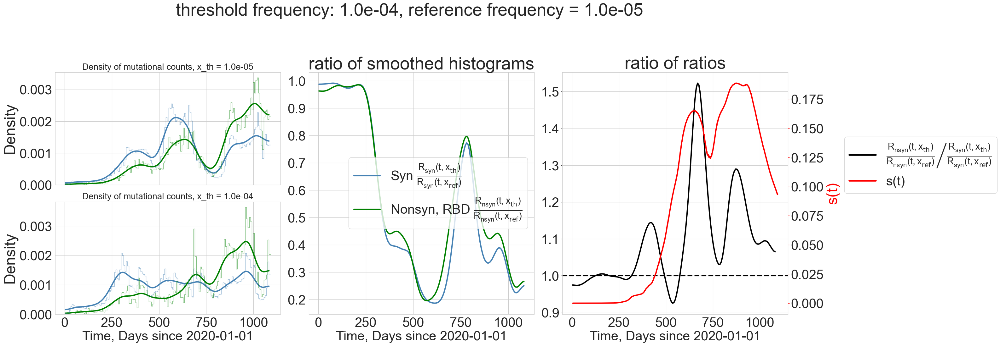

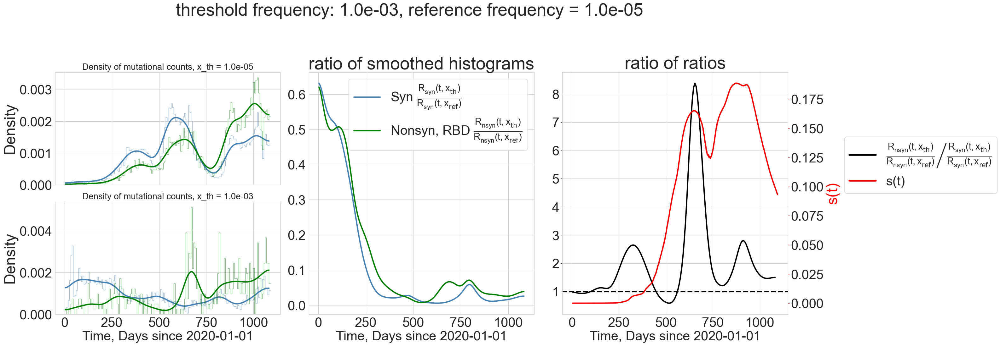

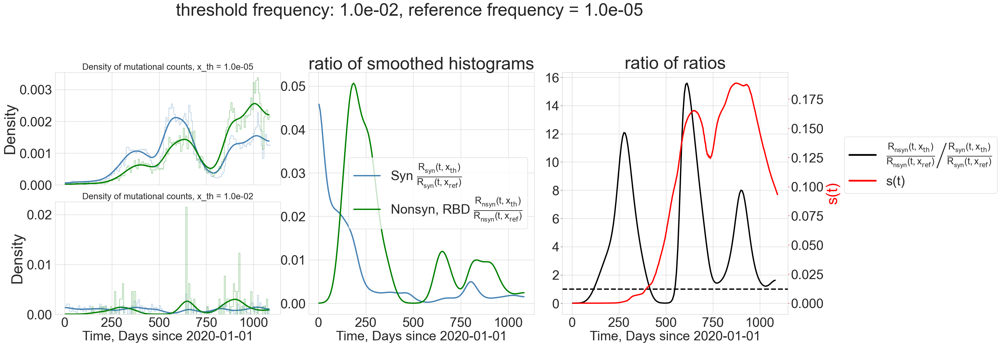

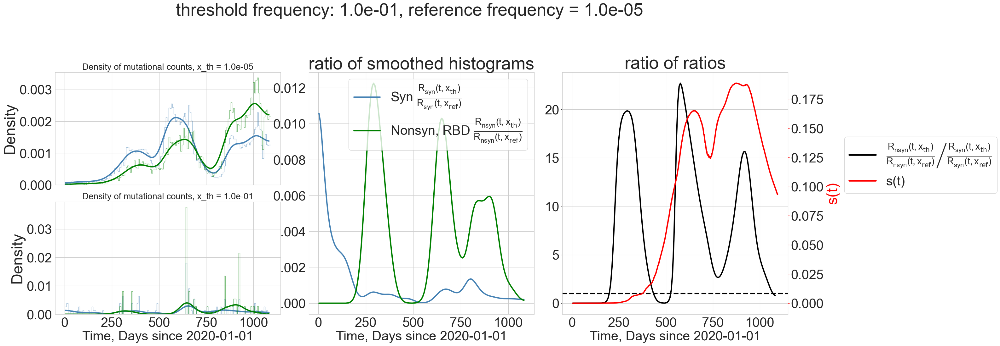

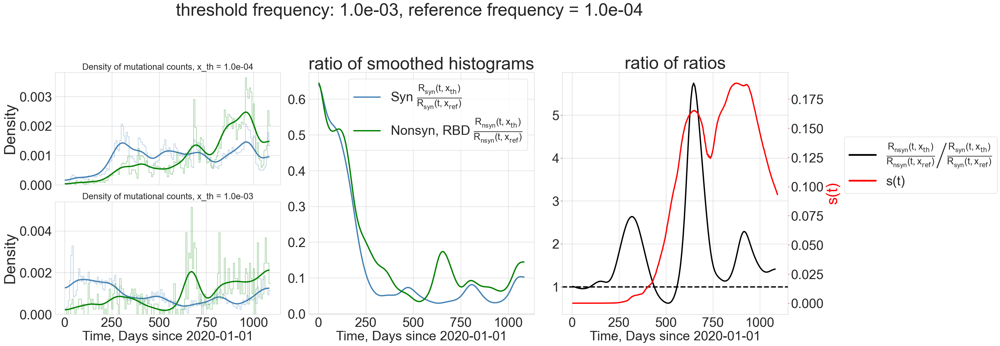

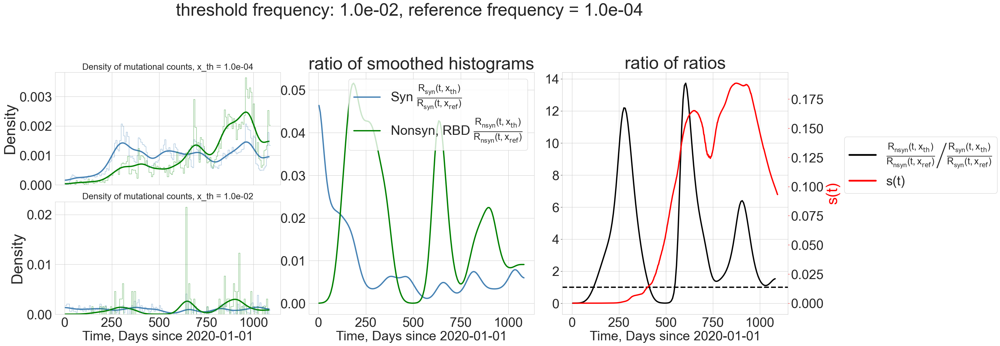

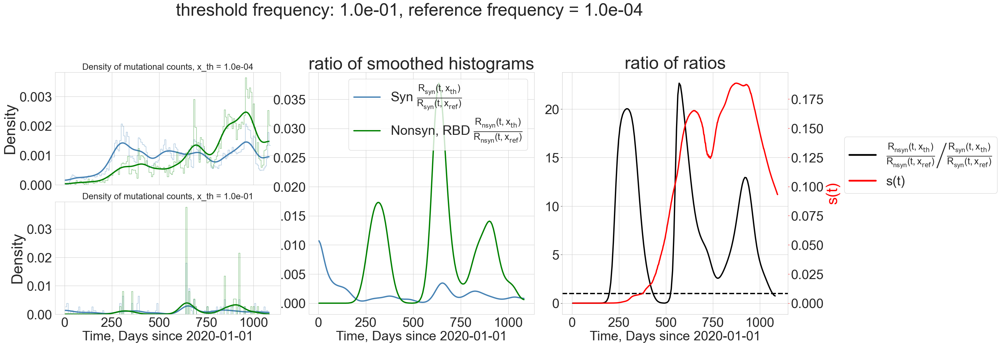

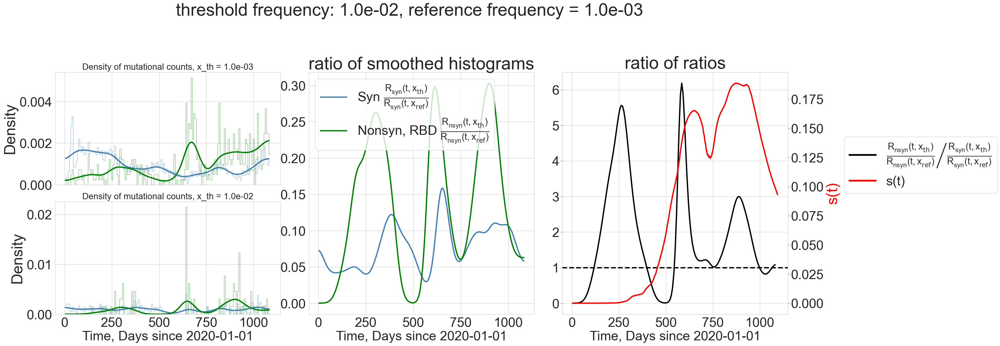

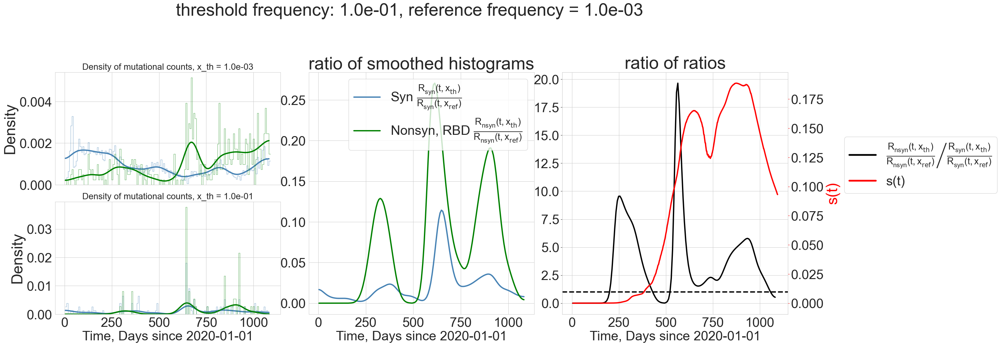

In [57]:
sigma_smoothing = 5

figure_mosaic = """
    AAACCCDDD
    BBBCCCDDD
    """

hist_ts = day_diff_weekly[:-1]
x_thresh_ref =1e-3
for x_thresh_ref in [1e-5,1e-4,1e-3]:
    for x_thresh in x_thresh_vals[x_thresh_vals > x_thresh_ref]:
        fig,axes = plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(30,10))
        plt.subplots_adjust(wspace=.5,hspace=.15)

        href_syn, bref_syn = np.histogram(syn_clade_stats.query(f'Max_Freq > {x_thresh_ref}')['day_diff'],bins = day_diff_weekly, density= False)
        hx_syn, bx_syn = np.histogram(syn_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, density= False)

        href_nonsyn_RBD, bref_nonsyn_RBD = np.histogram(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh_ref}')['day_diff'],bins = day_diff_weekly, density= False)
        
        hx_nonsyn_RBD, bx_nonsyn_RBD = np.histogram(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, density= False)

        ratio_nonsyn_RBD = hx_nonsyn_RBD/href_nonsyn_RBD
        ratio_syn = hx_syn/href_syn

        smoothed_href_syn = gaussian_filter1d(href_syn.astype('float'), sigma = sigma_smoothing)
        smoothed_hx_syn = gaussian_filter1d(hx_syn.astype('float'), sigma = sigma_smoothing)

        smoothed_href_nonsyn_RBD = gaussian_filter1d(href_nonsyn_RBD.astype('float'),sigma=sigma_smoothing)
        smoothed_hx_nonsyn_RBD = gaussian_filter1d(hx_nonsyn_RBD.astype('float'),sigma=sigma_smoothing)

        smoothed_ratio_nonsyn_RBD = smoothed_hx_nonsyn_RBD/smoothed_href_nonsyn_RBD
        smoothed_ratio_syn = smoothed_hx_syn/smoothed_href_syn

        ax_densities_0 = axes['A']
        ax_densities_x_thresh = axes['B']

        ax_densities_0.plot(hist_ts, smoothed_href_syn/np.trapz(smoothed_href_syn,hist_ts),color='steelblue')
        ax_densities_0.plot(hist_ts, smoothed_href_nonsyn_RBD/np.trapz(smoothed_href_nonsyn_RBD,hist_ts),color='green')

        ax_densities_x_thresh.plot(hist_ts, smoothed_hx_syn/np.trapz(smoothed_hx_syn,hist_ts),color='steelblue')    
        ax_densities_x_thresh.plot(hist_ts, smoothed_hx_nonsyn_RBD/np.trapz(smoothed_hx_nonsyn_RBD,hist_ts),color='green')

        sns.histplot(syn_clade_stats.query(f'Max_Freq > {x_thresh_ref}')['day_diff'],bins = day_diff_weekly, label = 'Synonymous',alpha=0.5, color='steelblue',ax=ax_densities_0,element='step', fill=False, stat='density', lw=1)
        sns.histplot(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh_ref}')['day_diff'],bins = day_diff_weekly, label = 'RBD',alpha=0.5, color='green',ax=ax_densities_0,element='step', fill=False, stat='density', lw=1)

        sns.histplot(syn_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'Synonymous',alpha=0.5, color='steelblue',ax=ax_densities_x_thresh,element='step', fill=False, stat='density', lw=1)
        sns.histplot(nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh}')['day_diff'],bins = day_diff_weekly, label = 'RBD',alpha=0.5, color='green',ax=ax_densities_x_thresh,element='step', fill=False, stat='density', lw=1)
        
        axes['A'].set_xticklabels('')
        axes['A'].set_xlabel('')

        plot_ratio = True
        if plot_ratio:
            ax_ratio = axes['C']
            # ax_ratio.plot(hist_ts, ratio_syn, color='steelblue',alpha=.5)
            # ax_ratio.plot(hist_ts, ratio_nonsyn_RBD, color='green',alpha=.5)
            ax_ratio.plot(hist_ts, smoothed_ratio_syn, color='steelblue', label = 'Syn ' + r'$\frac{R_{syn}(t,x_\mathrm{th})}{R_{syn}(t,x_\mathrm{ref})}$')
            ax_ratio.plot(hist_ts, smoothed_ratio_nonsyn_RBD, color='green', label = 'Nonsyn, RBD ' + r'$\frac{R_{nsyn}(t,x_\mathrm{th})}{R_{nsyn}(t,x_\mathrm{ref})}$')

        plot_ratio_of_ratios = True
        if plot_ratio_of_ratios:
            ax_ratio_of_ratios = axes['D']
            # ax_ratio_of_ratios.plot(hist_ts, ratio_nonsyn_RBD/ratio_syn,alpha=.5, color='black')
            ax_ratio_of_ratios.plot(hist_ts, smoothed_ratio_nonsyn_RBD/smoothed_ratio_syn,color= 'black', label = r'$\left.\frac{R_{nsyn}(t,x_\mathrm{th})}{R_{nsyn}(t,x_\mathrm{ref})}\middle/\frac{R_{syn}(t,x_\mathrm{th})}{R_{syn}(t,x_\mathrm{ref})}\right.$' )
            ax_ratio_of_ratios.axhline(1,color='k',ls='--')
        
        tax_D= axes['D'].twinx()
        tax_D.plot(day_diff, avg_pot_selection,color='red')
        tax_D.grid(False)
        tax_D.tick_params(color='red')
        tax_D.set_ylabel('s(t)',color='red')
        
        fig.suptitle(f'threshold frequency: {x_thresh:.1e}, reference frequency = {x_thresh_ref:.1e}',y=1.1)

        for ax_label in['B',"C",'D']:
            axes[ax_label].set_xlabel('Time, Days since 2020-01-01',fontsize=30)

        for a in axes:
            axes[a].tick_params(labelsize=30)


        # ax_ratio.set_ylim(top=np.min((20,1.5*np.max((ratio_syn[~np.isnan(ratio_syn)].max(),ratio_nonsyn_RBD[~np.isnan(ratio_nonsyn_RBD)].max())))),bottom=-1)

        axes['A'].set_title(f'Density of mutational counts, x_th = {x_thresh_ref:.1e}',fontsize=20)
        axes['B'].set_title(f'Density of mutational counts, x_th = {x_thresh:.1e}',fontsize=20)

        axes['C'].set_title('ratio of smoothed histograms')
        axes['D'].set_title('ratio of ratios')

        axes['C'].legend(loc='best',fontsize=30)

        handles_D = [
        Line2D([0], [0], color='black', lw=4, label=r'$\left.\frac{R_{nsyn}(t,x_\mathrm{th})}{R_{nsyn}(t,x_\mathrm{ref})}\middle/\frac{R_{syn}(t,x_\mathrm{th})}{R_{syn}(t,x_\mathrm{ref})}\right.$'),
        Line2D([0], [0], color='red', lw=4, label='s(t)'),   
        ]

        axes['D'].legend(handles = handles_D, loc=(1.25,.5),fontsize=30)
        
        savefig=1
        if savefig:
            os.makedirs(output_folder+f'/data_analysis_s_t0_{x_thresh_ref}/',exist_ok = True)
            fig.savefig(output_folder+f'/data_analysis_s_t0_{x_thresh_ref}/'+f'multiplot_ratios_x_th{x_thresh:.1e}_xref_{x_thresh_ref:.1e}.pdf',bbox_inches='tight')


In [ ]:

clade_list = ['WT', 'B.1.617.2', 'B.1.1.7', 'BA.1', 'BA.2', 'BA.5', 'JN.1', 'JN.1.4', 'BF.7', 'XBB.1.5', 'XBB.1.16', 'HK.3'  ]
avg_fit = np.sum([fitness_france[c+'_freq']*(fitness_france[c+'_fitness_inf']+fitness_france[c+'_fitness_vac'])\
                for c in clade_list],axis=0)

df_reworked = pd.DataFrame(columns = ['clade','day_diff','freq','avg_fit'])

for c in clade_list:
    vals  =fitness_france[[c+'_freq', c+'_fitness_vac', c+'_fitness_inf', c + '_F_pot_inf', c + '_F_pot_vac' , 'day_diff']]
    df_vals = pd.DataFrame(vals.values,columns=['freq','fit_vac','fit_inf',  'f_pot_inf','f_pot_vac','day_diff'])
    df_vals['avg_fit'] = avg_fit
    df_vals['cases'] = fitness_france['cases']
    extra_col = [c for i in range(len(vals))]

    df_reworked = pd.concat([df_reworked,pd.concat( [pd.DataFrame(extra_col,columns=['clade']),df_vals],axis=1)],axis=0)
df_reworked['fit'] = df_reworked['fit_vac'] + df_reworked['fit_inf']
df_reworked['f_pot'] = df_reworked['f_pot_inf'] + df_reworked['f_pot_vac']

df_reworked['selection'] = (df_reworked['fit'] - df_reworked['avg_fit'])*(df_reworked['freq']>0)
df_reworked['pot_selection'] = (df_reworked['f_pot'] - df_reworked['avg_fit'])*(df_reworked['freq']>0)
df_reworked['y_t'] = df_reworked['freq']*df_reworked['cases']
df_reworked['s_times_y_t'] = df_reworked['y_t']*df_reworked['selection']
df_reworked['pot_s_times_y_t'] = df_reworked['y_t']*df_reworked['pot_selection']

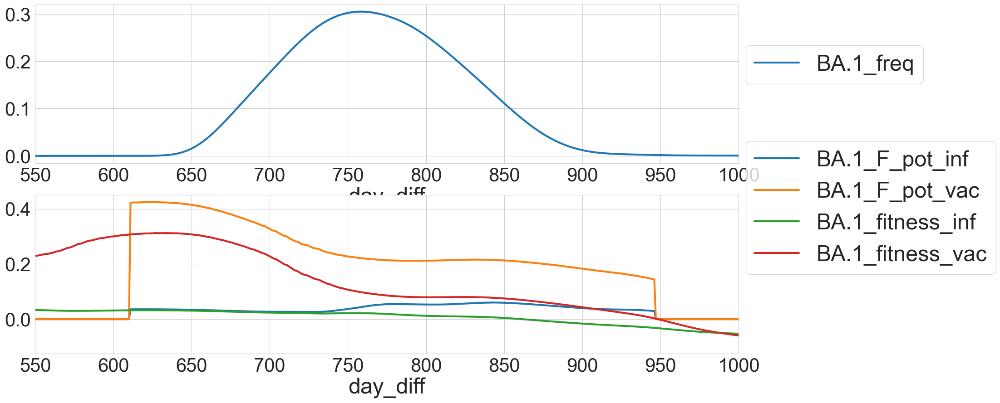

In [76]:
fig,ax = plt.subplots(2,1,figsize=(20,10))

fitness_france.plot(x='day_diff',y='BA.1_freq', ax = ax[0])

fitness_france.plot(x='day_diff',y='BA.1_F_pot_inf', ax = ax[1])

fitness_france.plot(x='day_diff',y='BA.1_F_pot_vac', ax = ax[1])

fitness_france.plot(x='day_diff',y='BA.1_fitness_inf', ax = ax[1])
fitness_france.plot(x='day_diff',y='BA.1_fitness_vac', ax = ax[1])

for a in ax:
    a.set_xlim(550,1000)
    a.legend(loc=(1.01,.5))

In [77]:
origination_times  = df_reworked.groupby('clade').apply(lambda x: x.loc[x['freq'] > 1e-2]['day_diff'].min())
#transform origination_times back to datetime
origination_dates = pd.to_datetime(origination_times,unit='D',origin='2020-01-01')

In [78]:
origination_dates.dropna(inplace=True)
origination_dates.sort_values(inplace=True)
#create a dataframe with the origination dates and clades
origination_df = pd.DataFrame(origination_dates,columns=['origination_date'])
origination_df['clade'] = origination_df.index
origination_df.reset_index(drop=True,inplace=True)
origination_df['day_diff'] = origination_times.dropna().sort_values().values

In [79]:
df_reworked.query(f'clade == "{c}"')['freq'].max()

7.057158353696055e-17

In [80]:
ax.get_ylim()[1]

AttributeError: 'numpy.ndarray' object has no attribute 'get_ylim'

In [81]:
World_cases

384408    2.002000e+00
384409    2.002000e+00
384410    4.500300e+01
384411    4.500300e+01
384412    4.500300e+01
              ...     
385489    4.423623e+07
385490    4.423623e+07
385491    4.423623e+07
385492    4.423623e+07
385493    4.423623e+07
Name: new_cases_smoothed, Length: 1086, dtype: float64

In [ ]:
covid_data = pd.read_csv(os.getcwd()+'/data/covid_data.csv')
covid_data_World_Full  = covid_data[covid_data['location'] == 'World']#.query(f'date < "{last_date}"')

In [ ]:

World_cases_Full = 7*covid_data_World_Full['new_cases_smoothed']
World_cases_Full = World_cases_Full[World_cases_Full>0]
World_cases_Full = World_cases_Full[~np.isinf(World_cases_Full)]

covid_data_World_Full['Time_datetime'] = pd.to_datetime(covid_data_World_Full['date'])
covid_data_World_Full['day_diff'] = covid_data_World_Full['Time_datetime']-reference_date

covid_data_World_Full['day_diff'] = covid_data_World_Full['day_diff'].apply(lambda x: x.days)
covid_data_World_Full['weekly_new_cases_smoothed'] = covid_data_World_Full['new_cases_smoothed']*7

I_over_time = covid_data_World_Full['weekly_new_cases_smoothed'].values

In [ ]:
day_diff_Full = covid_data_World_Full['day_diff'].values

In [ ]:
def integrate_trajectory(R0,kappa,N, I0=10,Nsteps = 10000):
    S0 = N-I0
    y0 = [S0,I0]
    x_inf = find_x_inf(R0,kappa)
    
    t_end = .5*np.log(N)* (1/(R0-1) + 1/(1-R0*x_inf))
    ts = np.linspace(0, t_end,Nsteps)
    dt = ts[1]-ts[0]
    solution  = odeint(model_w_params(R0,N,kappa),y0,ts).T
    x,y= solution
    tp = ts[np.argmax(y)]


    return ts, solution
R0 = 5
kappa = 1e4
N= 7.8e9
I0 = 1

ts, (S,I) = integrate_trajectory(R0,kappa,N,I0, Nsteps = int(1e6))

x,y = S/N,I/N

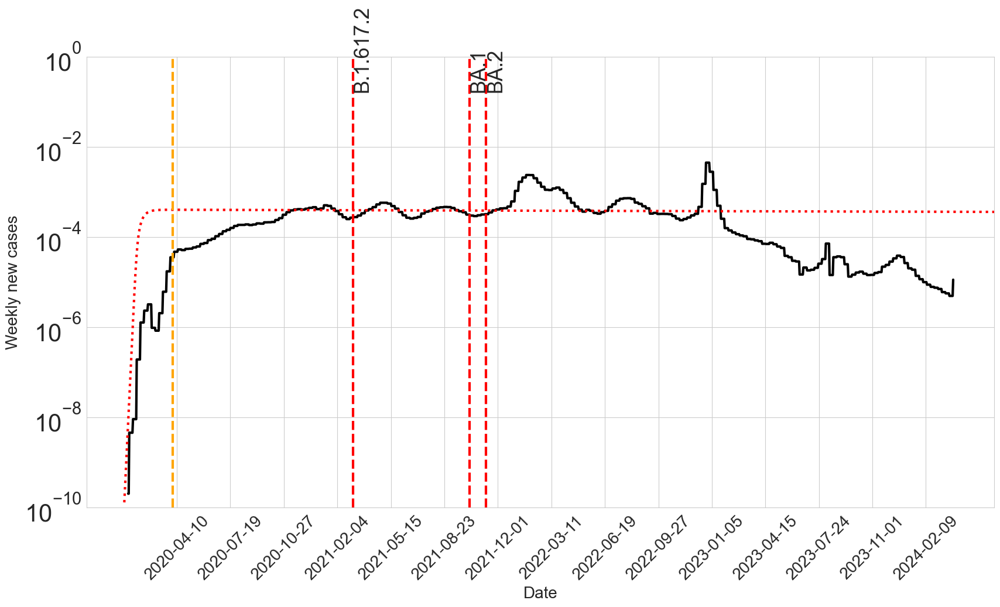

In [ ]:
fig,ax = plt.subplots(1,1,figsize=(20,10))
ax.plot(day_diff_Full,I_over_time/1e10,color='black')

ax.set_yscale('log')
if ax.get_yscale() == 'log':
    ax.set_ylim(bottom=1e-10,top=1e0)
# ax.set_ylim(-100,4e7)
for c, d in zip(origination_df['clade'],origination_df['day_diff']):
    if d<300:
        continue
    if df_reworked.query(f'clade == "{c}"')['freq'].max() < 4.5e-1 and c != 'BA.1':
        continue
    ax.axvline(d,color='red',label=c,ls='--')
    ax.annotate(c, xy=(d,ax.get_ylim()[1]*.2 ),rotation=90,fontsize=25)

#bring ticks back to dates
# ax.set_xlim(0,1000)

ax.set_xticks(np.arange(1,16)*100)
ax.set_xticklabels(pd.to_datetime(ax.get_xticks(),unit='D',origin='2020-01-01').strftime('%Y-%m-%d'),rotation=45,fontsize=20);
ax.set_xlabel('Date',fontsize=20)

ax.set_ylabel('Weekly new cases',fontsize=20)



if ax.get_yscale() == 'log':
        
    xlim = ax.get_xlim()
    ax.plot((ts+ts[11])*7,y,color='red',ls=':')
    ax.set_xlim(xlim)

    ax.axvline((ts[np.argmax(y)]+ts[11])*7,color='orange',ls='--')

# ax.tick_params(labelsize=30)
# ax.set_xticks(ax.get_xticks()[::2])
plt.savefig(output_folder+ax.get_yscale()+'World_cases_with_clade_origination.svg',bbox_inches='tight')

In [ ]:
1/(5e-4) #* 1/np.sqrt(1e6/5) # weeks

2000.0

In [ ]:
list(zip(origination_times.dropna().clade,np.sort(origination_times.dropna()), np.sort(origination_dates.dropna())))

AttributeError: 'Series' object has no attribute 'clade'

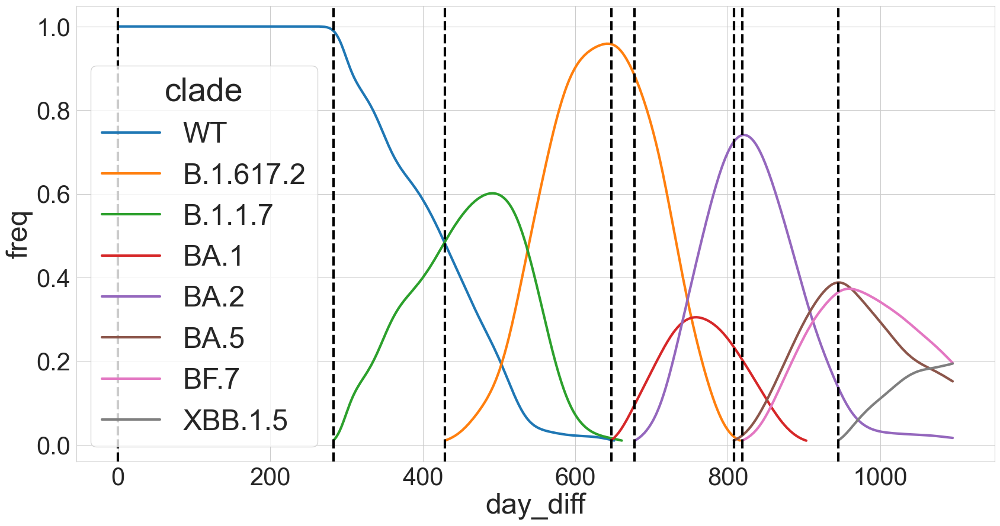

In [ ]:
fig,ax = plt.subplots(1,figsize=(20,10))
sns.lineplot(data = df_reworked.query('freq > 1e-2'),x='day_diff',y='freq',hue='clade')

for o in origination_times:
    ax.axvline(o,color='k',ls='--')

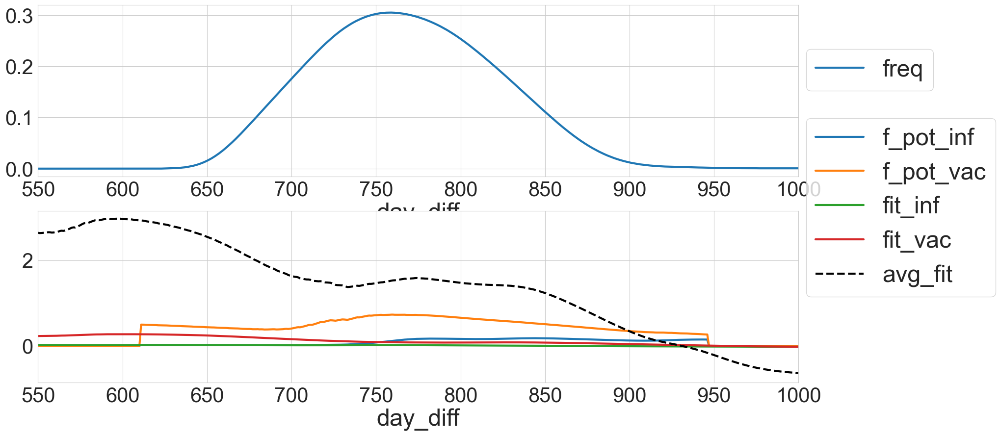

In [ ]:
fig,ax = plt.subplots(2,1,figsize=(20,10))

df_reworked.query('clade == "BA.1"').plot(x='day_diff',y='freq', ax = ax[0])

df_reworked.query('clade == "BA.1"').plot(x='day_diff',y='f_pot_inf', ax = ax[1])

df_reworked.query('clade == "BA.1"').plot(x='day_diff',y='f_pot_vac', ax = ax[1])

df_reworked.query('clade == "BA.1"').plot(x='day_diff',y='fit_inf', ax = ax[1])
df_reworked.query('clade == "BA.1"').plot(x='day_diff',y='fit_vac', ax = ax[1])

df_reworked.query('clade == "BA.1"').plot(x='day_diff',y='avg_fit', ax = ax[1],color='black',ls='--')

for a in ax:
    a.set_xlim(550,1000)
    a.legend(loc=(1.01,.5))

In [ ]:
fitness_france

,Unnamed: 0,WT_freq,WT_fitness_inf,WT_fitness_vac,WT_F_pot_inf,WT_F_pot_vac,B.1.617.2_freq,B.1.617.2_fitness_inf,B.1.617.2_fitness_vac,B.1.617.2_F_pot_inf,...,XBB.1.9_F_pot_vac,XBB.1.16_freq,XBB.1.16_fitness_inf,XBB.1.16_fitness_vac,XBB.1.16_F_pot_inf,XBB.1.16_F_pot_vac,av_pot_selection,date,day_diff,s_w
0,43830,1.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,2020-01-01,0,0.000000
1,43831,1.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,2020-01-02,1,0.000000
2,43832,1.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,2020-01-03,2,0.000000
3,43833,1.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,2020-01-04,3,0.000000
4,43834,1.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,2020-01-05,4,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,44921,0.0,0.060217,-0.269232,0.0,0.0,0.0,0.066632,-0.151761,0.0,...,0.154563,0.000044,0.043476,0.034095,0.0,0.0,0.402431,2022-12-27,1091,2.817014
1092,44922,0.0,0.060140,-0.267542,0.0,0.0,0.0,0.066549,-0.150306,0.0,...,0.154962,0.000051,0.043287,0.033844,0.0,0.0,0.402011,2022-12-28,1092,2.814078
1093,44923,0.0,0.060061,-0.265821,0.0,0.0,0.0,0.066465,-0.148883,0.0,...,0.154981,0.000060,0.043098,0.033587,0.0,0.0,0.401208,2022-12-29,1093,2.808458
1094,44924,0.0,0.059984,-0.264152,0.0,0.0,0.0,0.066382,-0.147473,0.0,...,0.155199,0.000069,0.042909,0.033341,0.0,0.0,0.400618,2022-12-30,1094,2.804323


ValueError: Could not interpret value `selection` for `y`. An entry with this name does not appear in `data`.

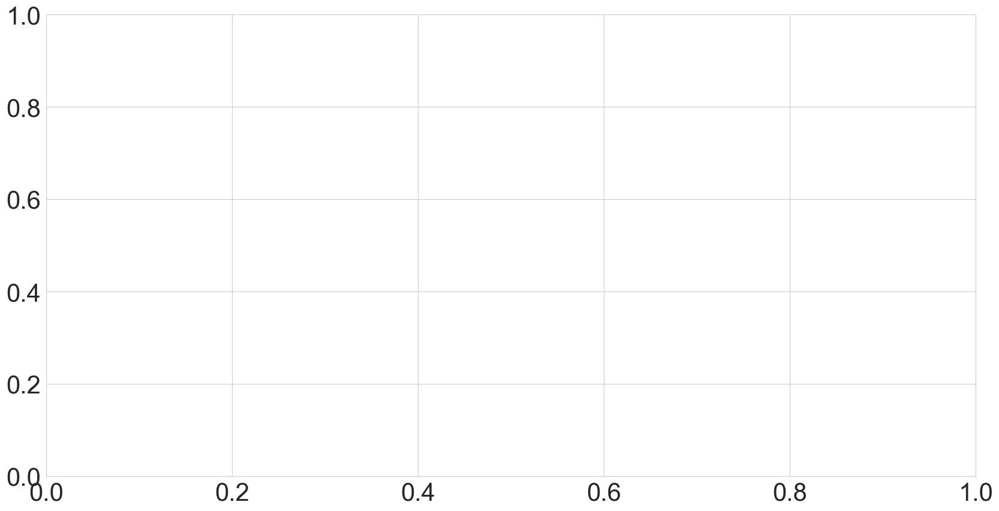

In [ ]:
fig,ax = plt.subplots(1,figsize=(20,10))
sns.lineplot(data = df_reworked,x='day_diff',y='selection',hue = 'clade')
ax.legend(loc='upper left',bbox_to_anchor=(1,1))

In [ ]:
fitness_france_new

,Unnamed: 0,WT_freq,WT_fitness_inf,WT_fitness_vac,WT_F_pot_inf,WT_F_pot_vac,B.1.617.2_freq,B.1.617.2_fitness_inf,B.1.617.2_fitness_vac,B.1.617.2_F_pot_inf,...,HK.3_freq,HK.3_fitness_inf,HK.3_fitness_vac,HK.3_F_pot_inf,HK.3_F_pot_vac,av_pot_selection,cases,date,day_diff,s_w
0,43830,1.0,0.0000,0.0000,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,2020-01-01,0,0.0000
1,43831,1.0,0.0000,0.0000,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,2020-01-02,1,0.0000
2,43832,1.0,0.0000,0.0000,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,2020-01-03,2,0.0000
3,43833,1.0,0.0000,0.0000,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,2020-01-04,3,0.0000
4,43834,1.0,0.0000,0.0000,0.0,0.0,0.0,0.0000,0.0000,0.0,...,0.0,0.0000,0.0000,0.0,0.0,0.0000,0.0000,2020-01-05,4,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1091,44921,0.0,-0.0317,-0.1357,0.0,0.0,0.0,-0.0324,-0.1308,0.0,...,0.0,0.0328,0.0293,0.0,0.0,0.2162,0.0007,2022-12-27,1091,1.5134
1092,44922,0.0,-0.0317,-0.1349,0.0,0.0,0.0,-0.0323,-0.1300,0.0,...,0.0,0.0326,0.0291,0.0,0.0,0.2163,0.0007,2022-12-28,1092,1.5141
1093,44923,0.0,-0.0317,-0.1341,0.0,0.0,0.0,-0.0323,-0.1293,0.0,...,0.0,0.0324,0.0289,0.0,0.0,0.2161,0.0007,2022-12-29,1093,1.5127
1094,44924,0.0,-0.0317,-0.1333,0.0,0.0,0.0,-0.0323,-0.1285,0.0,...,0.0,0.0323,0.0287,0.0,0.0,0.2160,0.0007,2022-12-30,1094,1.5120


In [ ]:

clade_list = ['WT', 'B.1.617.2', 'B.1.1.7', 'BA.1', 'BA.2', 'BA.5', 'JN.1', 'JN.1.4', 'BF.7', 'XBB.1.5', 'XBB.1.16', 'HK.3'  ]
avg_fit = np.sum([fitness_france_new[c+'_freq']*\
                  (fitness_france_new[c+'_fitness_inf']+fitness_france_new[c+'_fitness_vac'])\
                for c in clade_list],axis=0)

df_reworked = pd.DataFrame(columns = ['clade','day_diff','freq','avg_fit'])

for c in clade_list:
    vals  =fitness_france_new[[c+'_freq', c+'_fitness_vac', c+'_fitness_inf', c + '_F_pot_inf', c + '_F_pot_vac' , 'day_diff']]
    df_vals = pd.DataFrame(vals.values,columns=['freq','fit_vac','fit_inf',  'f_pot_inf','f_pot_vac','day_diff'])
    df_vals['avg_fit'] = avg_fit
    df_vals['cases'] = fitness_france_new['cases']
    extra_col = [c for i in range(len(vals))]

    

    df_reworked = pd.concat([df_reworked,pd.concat( [pd.DataFrame(extra_col,columns=['clade']),df_vals],axis=1)],axis=0)


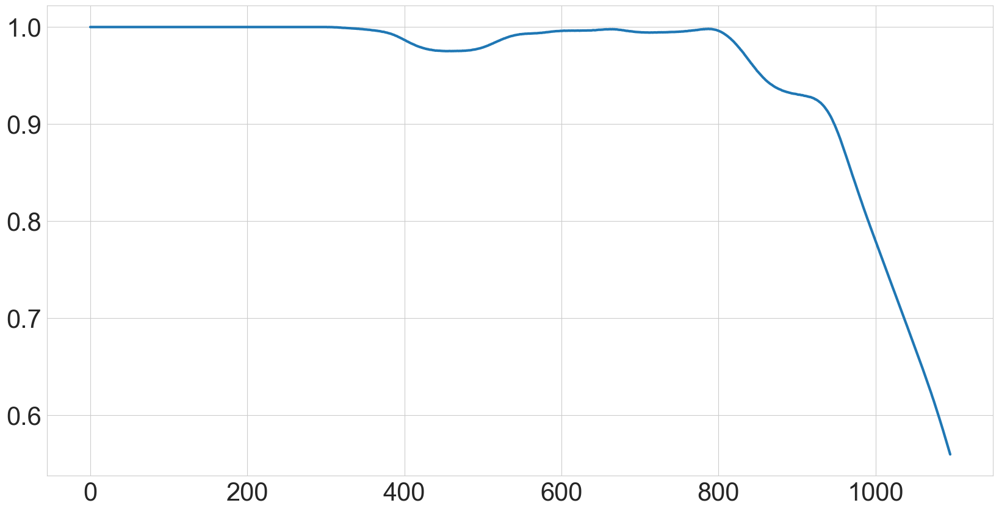

In [ ]:
sum_freq = np.sum([fitness_france_new[c+'_freq']\
                for c in clade_list],axis=0)

plt.plot(sum_freq)

In [ ]:
df_reworked['fit'] = df_reworked['fit_vac'] + df_reworked['fit_inf']
df_reworked['f_pot'] = df_reworked['f_pot_vac'] + df_reworked['f_pot_inf']

df_reworked['selection'] = (df_reworked['fit'] - df_reworked['avg_fit'])*(df_reworked['freq']>0)
df_reworked['pot_selection'] = (df_reworked['f_pot'] - df_reworked['avg_fit'])*(df_reworked['freq']>0)

In [ ]:
df_reworked['is_sweeping'] = df_reworked['selection'] > 0

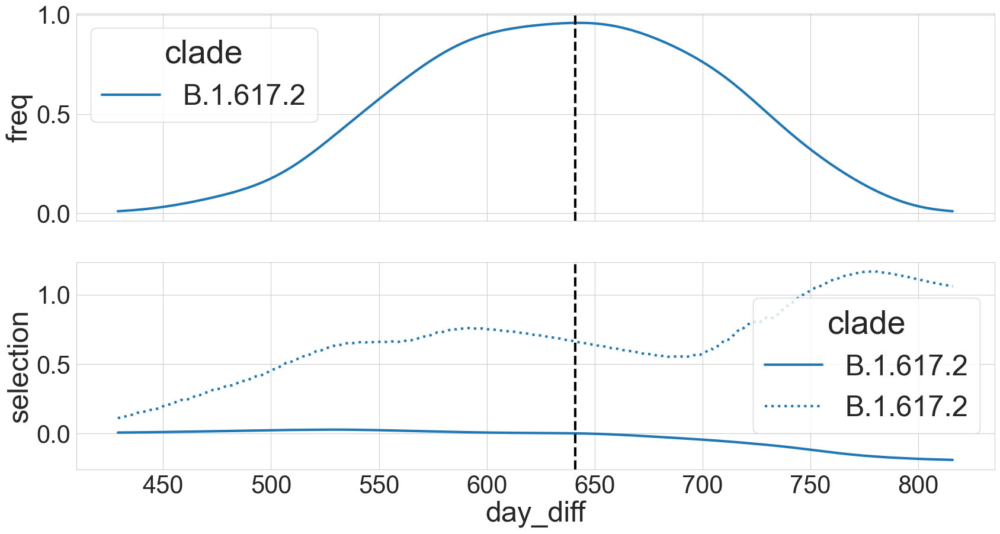

In [ ]:

fig,ax=  plt.subplots(2,1,sharex=True)

sns.lineplot(data = df_reworked.query('freq>.01 & clade == "B.1.617.2"'), x = 'day_diff', y = 'freq', hue = 'clade',ax= ax[0])
sns.lineplot(data = df_reworked.query('freq>.01 & clade == "B.1.617.2"'), x = 'day_diff', y = 'selection', hue = 'clade',ax= ax[1])
sns.lineplot(data = df_reworked.query('freq>.01 & clade == "B.1.617.2"'), x = 'day_diff', y = 'pot_selection', hue = 'clade',ax= ax[1],ls=":")
#axvline at day of peak frequency
peak_day = df_reworked.query('clade == "B.1.617.2"').query('freq == freq.max()')['day_diff'].values[0]
ax[0].axvline(peak_day,color='k',ls='--')

ax[1].axvline(peak_day,color='k',ls='--')

# ax[1].legend(loc=(1.01,.1))
# ax.set_xlim(550,1000)


Text(0.5, 1.0, 'Potential selection')

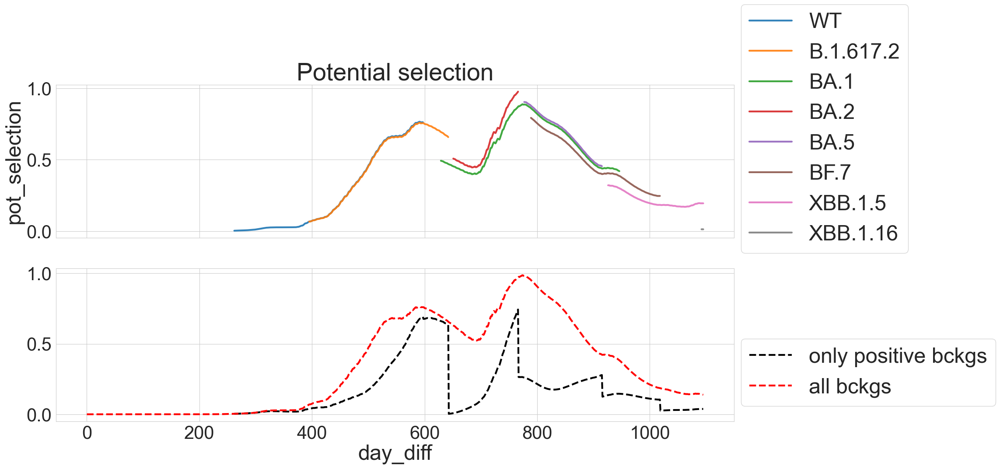

In [ ]:
fig,ax=  plt.subplots(2,1,sharex=True)
sns.lineplot(data = df_reworked.query('selection > 0 & freq > 5e-4'), x = 'day_diff', y = 'pot_selection', hue = 'clade',ax= ax[0],alpha=.9)

df_reworked.query('selection > 0').groupby(['day_diff']).apply(lambda x: np.sum(x['freq']*x['pot_selection'])).plot(color='black',ax=ax[1],ls= '--',label='only positive bckgs')
df_reworked.groupby(['day_diff']).apply(lambda x: np.sum(x['freq']*x['pot_selection'])).plot(color='red',ax=ax[1],ls= '--',label = 'all bckgs')
ax[0].legend(loc=(1.01,-.1))
ax[1].legend(loc=(1.01,.1))

ax[0].set_title('Potential selection')

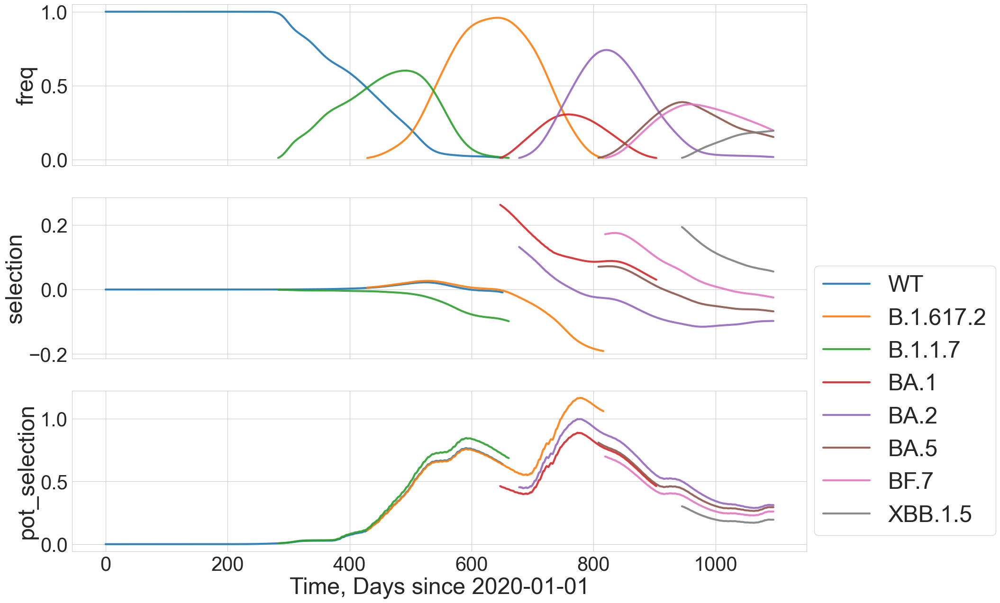

In [ ]:
fig,ax= plt.subplots(3,1,figsize = (20,15),sharex=True)
sns.lineplot(data = df_reworked.query(' freq > 1e-2'), x = 'day_diff', y = 'selection', hue = 'clade',alpha=.9,ax = ax[1],legend=False)
sns.lineplot(data = df_reworked.query(' freq > 1e-2'), x = 'day_diff', y = 'pot_selection', hue = 'clade',alpha=.9,ax = ax[2])
sns.lineplot(data = df_reworked.query(' freq > 1e-2'), x = 'day_diff', y = 'freq', hue = 'clade',alpha=.9,ax = ax[0],legend=False)
ax[-1].set_xlabel('Time, Days since 2020-01-01')

for a in [ax[-1]]:
    a.legend(loc=(1.01,.1))
date_crossover= '2021-06-06'
# ax.axvline(pd.to_datetime(date_crossover)
#            -reference_date,color='black',ls='--')

<Axes: xlabel='day_diff', ylabel='pot_selection'>

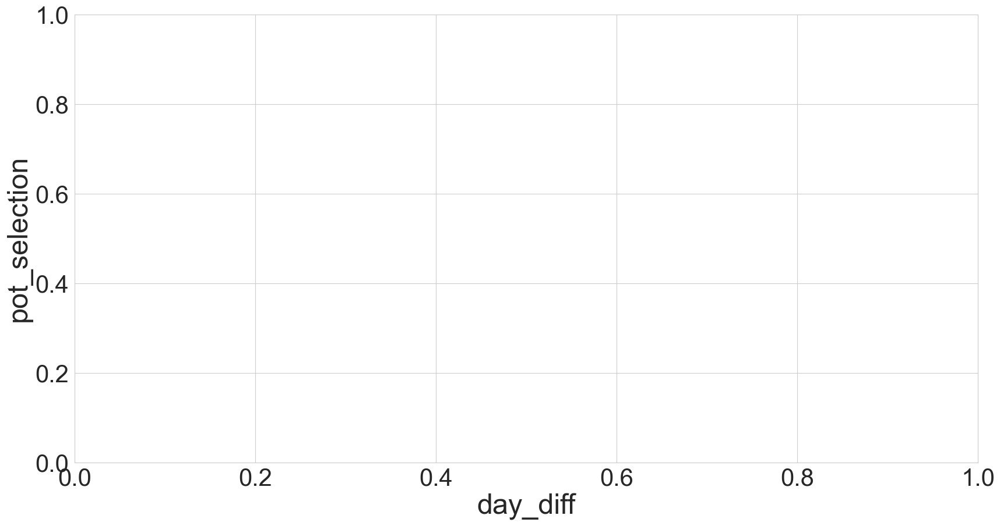

In [ ]:
fig,ax = plt.subplots()

sns.lineplot(data = df_reworked.query('clade == ""'), x = 'day_diff', y = 'pot_selection', hue = 'clade',ax= ax,alpha=.9)

In [ ]:
for x_thresh in x_thresh_vals:
    print(f"x_thresh = {x_thresh:.1e}")
    print((nonsyn_RBD_clade_stats.query(f'Max_Freq > {x_thresh}').count()/syn_clade_stats.query(f'Max_Freq > {x_thresh}').count()).values[0])
    print()

x_thresh = 0.0e+00
0.0656611957921472

x_thresh = 1.0e-05
0.06508871415626553

x_thresh = 1.0e-04
0.07447013046463721

x_thresh = 1.0e-03
0.08988899613899613

x_thresh = 1.0e-02
0.1771523178807947

x_thresh = 1.0e-01
0.42105263157894735



In [ ]:
8/52 * 7e-2

0.01076923076923077

In [ ]:
u_nucl_p_year = 1e-4
u_nsyn_p_year = .6* u_nucl_p_year
u_nsyn_p_week = u_nsyn_p_year/52
R0 = 3
delta = 1/5

N=1e10

Lmin = 1/(N*u_nsyn_p_week * delta *0.5*(R0-1)**2/R0**2)
print(Lmin)

0.0019499999999999995


In [ ]:
average_infected_size = covid_data_World['weekly_new_cases_smoothed'].mean()
average_s = nonsyn_S_clade_stats.query('day_diff < 400')['s_w'].mean()

print(f'N = {average_infected_size:.1e}, s = {average_s:.1e}, Ns = {average_infected_size*average_s:.1e}')
print(f'freq_sel= {1/(average_infected_size*average_s):.1e}') 
print(f'hallatschek`s freq_sel= {1000/(average_infected_size*average_s):.1e}') 

KeyError: 's_w'

0.2823272040928748 lifetime: 120.0


KeyError: 's'

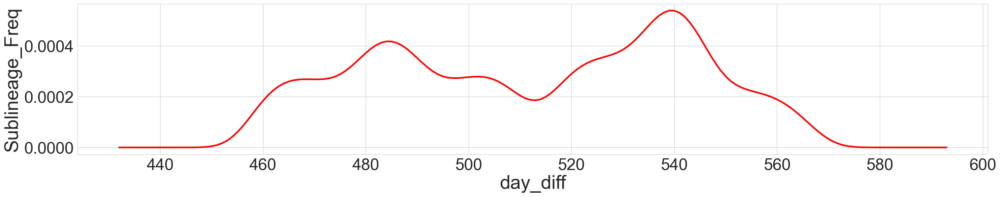

In [ ]:
for i in range(20):
    random_clade = random.choice(nonsyn_S_clade_stats['Clade'].values)

    subset = nonsyn_S_clade_statistics_SARS_CoV_2_World[nonsyn_S_clade_statistics_SARS_CoV_2_World['Clade'] == random_clade][['day_diff', 'Sublineage_Freq']].values
    # subset = subset.dropna(subset=['day_diff', 'Sublineage_Freq'])
    #sort by day_diff
    subset = subset[subset[:,0].argsort()]
    x = subset[:,0]
    y = subset[:,1]
    
    try:
        x = x[y>1e-5]
        y = y[y>1e-5] 
        
        g_rate = np.average(np.log(y[1:10] * (1-y[:9]) / (y[:9]*(1-y[1:10]))) / (x[1:10] - x[:9]))
        print(g_rate, f'lifetime: {x[-1]-x[0]}')

        fig,ax = plt.subplots(1,figsize = (30,5))
        sns.lineplot(nonsyn_S_clade_statistics_SARS_CoV_2_World.query(
            f'Clade == {random_clade}'
        ), x = 'day_diff', y = 'Sublineage_Freq',color='red',ax=ax)
        # ax.plot(x,y,marker='o',linestyle='--')

        s= nonsyn_S_clade_stats.query(f'Clade == {random_clade}')['s'].values[0]
        print(s)
        ax.plot(x[:],y.min()*np.exp(s*(x[:]-x[0])),linestyle='-',color='black')
        ax.plot(x[:],y.min()*np.exp(g_rate*(x[:]-x[0])),linestyle='-',color='red')
        ax.set_ylim(np.min(y)*.1,np.max(y)*1.1) 
        ax.set_yscale('log')

        ax.set_xlabel('Days since 2020-01-01',fontsize=30)
        fig.suptitle(f'Clade: {random_clade}',fontsize=30)
    except IndexError:
        pass

(1e-05, 0.99999)

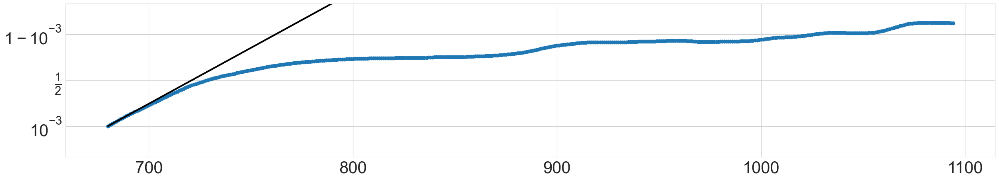

In [ ]:
random_clade = random.choice(nonsyn_RBD_clade_stats.query('Max_Freq > .9')['Clade'].values)

subset = nonsyn_RBD_clade_statistics_SARS_CoV_2_World[nonsyn_RBD_clade_statistics_SARS_CoV_2_World['Clade'] == random_clade][['day_diff', 'Sublineage_Freq']].values
# subset = subset.dropna(subset=['day_diff', 'Sublineage_Freq'])
#sort by day_diff
subset = subset[subset[:,0].argsort()]
x = subset[:,0]
y = subset[:,1]
x = x[y>1e-3]
y = y[y>1e-3]
s= nonsyn_RBD_clade_stats.query(f'Clade == {random_clade}')['s'].values[0]
fig,ax = plt.subplots(1,figsize = (30,5))
ax.plot(x,y,marker='o',linestyle='--')
ax.plot(x,y.min()*np.exp(s*(x-x[0]))/(1 +y.min()*np.exp(s*(x-x[0]))),linestyle='-',color='black')
ax.set_yscale('logit')
ax.set_ylim(1e-5,1-1e-5)

In [ ]:
y[0]*np.exp(s*x[1:])

array([4.27068654e+46, 5.05068143e+46, 5.97313398e+46, 7.06406255e+46,
       8.35423747e+46, 9.88004894e+46, 1.16845334e+47, 1.38185876e+47,
       1.63424037e+47, 1.93271677e+47, 2.28570667e+47, 2.70316636e+47,
       3.19687058e+47, 3.78074455e+47, 4.47125681e+47, 5.28788369e+47,
       6.25365868e+47, 7.39582206e+47, 8.74658928e+47, 1.03440596e+48,
       1.22332906e+48, 1.44675694e+48, 1.71099150e+48, 2.02348567e+48,
       2.39305353e+48, 2.83011897e+48, 3.34700971e+48, 3.95830497e+48,
       4.68124673e+48, 5.53622601e+48, 6.54735805e+48, 7.74316246e+48,
       9.15736766e+48, 1.08298622e+49, 1.28078199e+49, 1.51470302e+49,
       1.79134721e+49, 2.11851747e+49, 2.50544187e+49, 2.96303383e+49,
       3.50420004e+49, 4.14420442e+49, 4.90109871e+49, 5.79623159e+49,
       6.85485084e+49, 8.10681550e+49, 9.58743801e+49, 1.13384803e+50,
       1.34093315e+50, 1.58584015e+50, 1.87547677e+50, 2.21801239e+50,
       2.62310846e+50, 3.10219096e+50, 3.66877271e+50, 4.33883453e+50,
      

In [ ]:
average_infected_size = covid_data_World['weekly_new_cases_smoothed'].mean()
average_s = nonsyn_S_clade_stats.query('day_diff < 400')['s_w'].mean()

print(f'N = {average_infected_size:.1e}, s = {average_s:.1e}, Ns = {average_infected_size*average_s:.1e}')

N = 4.5e+06, s = 4.4e-01, Ns = 2.0e+06


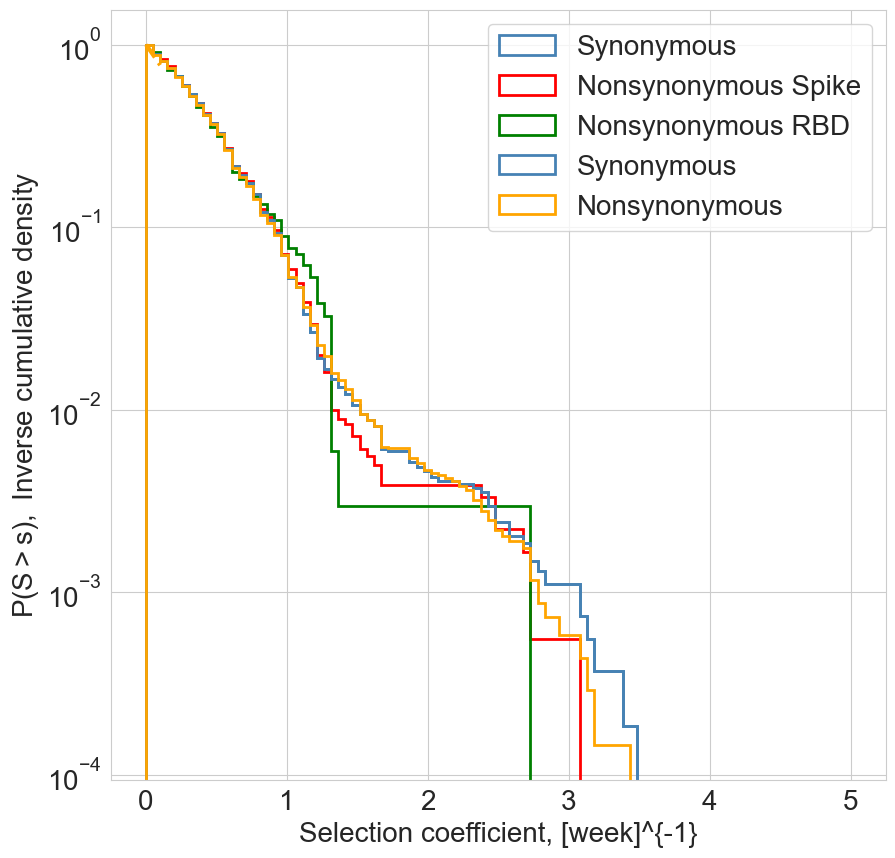

In [ ]:
syn_clade_stats['s_w'] = syn_clade_stats['selection']*7
nonsyn_all_clade_stats['s_w'] = nonsyn_all_clade_stats['s']*7
bins = np.linspace(0,5,100)
fig,ax= plt.subplots(1,figsize = (10,10))
plt.hist(syn_clade_stats['s_w'].values[~np.isnan(syn_clade_stats['s_w'])],bins = bins,density= True, label = 'Synonymous',color='steelblue',alpha=1,fill=False,cumulative=-1, histtype = 'step',lw = 2);

plt.hist(nonsyn_S_clade_stats['s_w'].values[~np.isnan(nonsyn_S_clade_stats['s_w'])],bins = bins,density= True, label = 'Nonsynonymous Spike',color='red',alpha=1,fill=False,cumulative=-1, histtype = 'step',lw = 2);

plt.hist(nonsyn_RBD_clade_stats['s_w'].values[~np.isnan(nonsyn_RBD_clade_stats['s_w'])],bins = bins,density= True, label = 'Nonsynonymous RBD',color='green',alpha=1,fill=False,cumulative=-1, histtype = 'step',lw = 2);

plt.hist(syn_clade_stats['s_w'].values[~np.isnan(syn_clade_stats['s_w'])],bins = bins,density= True, label = 'Synonymous',color='steelblue',alpha=1,fill=False,cumulative=-1, histtype = 'step',lw = 2);

plt.hist(nonsyn_all_clade_stats['s_w'].values[~np.isnan(nonsyn_all_clade_stats['s_w'])],bins = bins,density= True, label = 'Nonsynonymous',color='orange',alpha=1,fill=False,cumulative=-1, histtype = 'step',lw = 2);

# ax.set_xlim(left=.39,right=.6)
ax.set_yscale('log')
ax.legend(loc='best',fontsize=20)

sarr = np.linspace(0,.1,100)
ax.plot(sarr, np.exp(- sarr/np.average(nonsyn_S_clade_stats['s_w'].values[~np.isnan(nonsyn_S_clade_stats['s_w'])]) )
,linestyle='--',color='orange')

ax.set_xlabel('Selection coefficient, [week]^{-1}',fontsize=20)
ax.set_ylabel(r'$P(S>s),$ Inverse cumulative density',fontsize=20)

ax.tick_params(axis='both', which='major', labelsize=20)

In [ ]:
reference_date

Timestamp('2020-01-01 00:00:00')

In [ ]:
reference_date = pd.to_datetime('2020-01-01')
syn_clade_statistics_SARS_CoV_2_World['day_diff'] = (pd.to_datetime(syn_clade_statistics_SARS_CoV_2_World['Time']) - reference_date).dt.days
nonsyn_all_clade_statistics_SARS_CoV_2_World['day_diff'] = (pd.to_datetime(nonsyn_all_clade_statistics_SARS_CoV_2_World['Time']) - reference_date).dt.days
nonsyn_S_clade_statistics_SARS_CoV_2_World['day_diff'] = (pd.to_datetime(nonsyn_S_clade_statistics_SARS_CoV_2_World['Time']) - reference_date).dt.days

def initial_growth(clade,df):
    x = np.sort(df.query(f'Clade=={clade}')['day_diff'].values)
    y = np.sort(df.query(f'Clade=={clade}')['Sublineage_Freq'].values)
    g_rate = np.average(np.log(y[1:10]/y[:9])/(x[1:10]-x[:9]))
    return g_rate

0.00032901763916015625
5.4836273193359375e-05


(1e-19, 1)

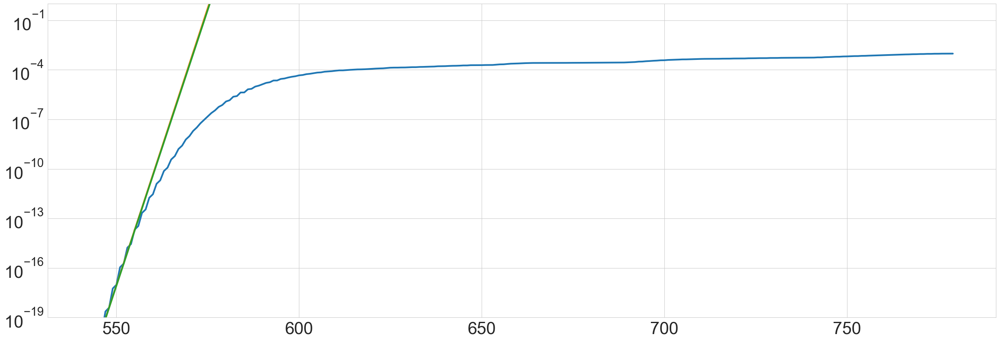

In [ ]:
randind = rnd.randint(0,len(syn_clade_stats))
clade = syn_clade_stats.iloc[randind]['Clade']
x = np.sort(syn_clade_statistics_SARS_CoV_2_World.query(f'Clade=={clade}')['day_diff'].values)
y = np.sort(syn_clade_statistics_SARS_CoV_2_World.query(f'Clade=={clade}')['Sublineage_Freq'].values)

fitfunc = lambda x,b: np.exp(b*x)
from time import time
t0 = time()
popt, pcov = so.curve_fit(fitfunc, x[:10]-x[0],y[:10]/y[0])
b = popt
print(time()-t0)
t1 = time()
g_rate = np.average(np.log(y[1:10]/y[:9])/(x[1:10]-x[:9]))
print(time()-t1)
fig,ax = plt.subplots(1,figsize = (30,10))
plt.plot(x,y)
ax.plot(x,y[0]*fitfunc(x-x[0],b))
ax.plot(x,y[0]*np.exp(g_rate*(x-x[0])))
ax.set_yscale('log')
ax.set_ylim(1e-19,1)


In [ ]:
colors_xmin = dict(zip(xmin_vals, sns.color_palette('viridis',len(xmin_vals))))

In [ ]:
wt_alpha_crossover_date = pd.to_datetime('2021-03-15')
alpha_delta_crossover_date = pd.to_datetime('2021-06-21')
delta_ba1_crossover_date = pd.to_datetime('2022-01-03')
ba1_ba2_crossover_date = pd.to_datetime('2022-01-31')
ba2_ba5_crossover_date = pd.to_datetime('2022-06-06')
ba5_xbb_crossover_date = pd.to_datetime('2023-02-27')

In [ ]:
xmin_vals =[0]+ list(np.logspace(-7,0,20))

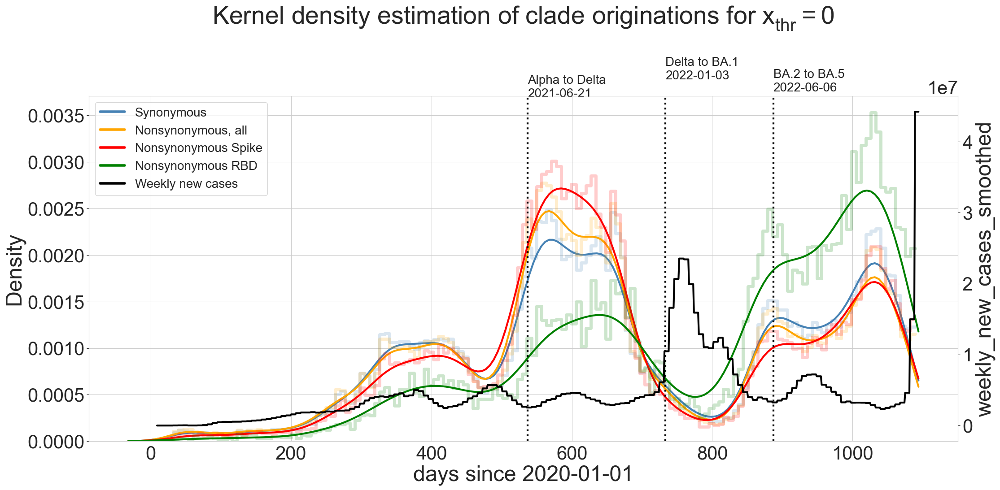

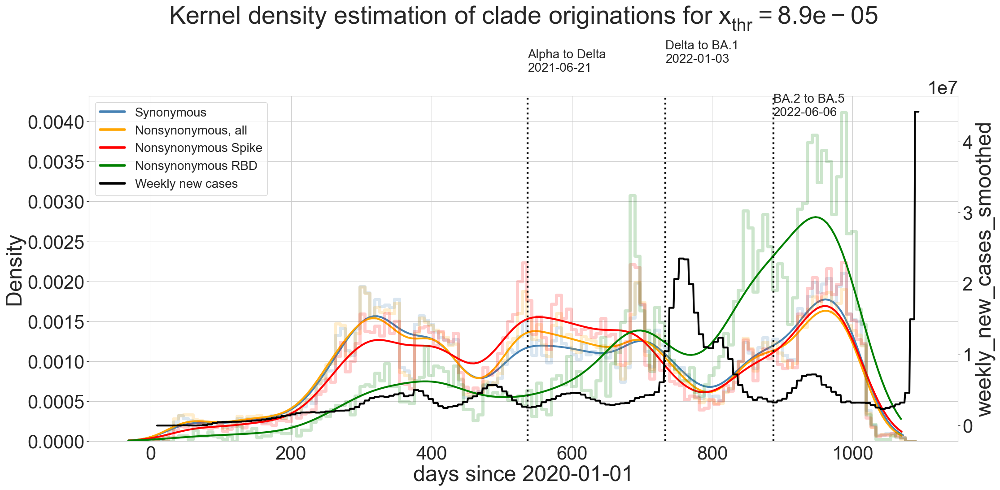

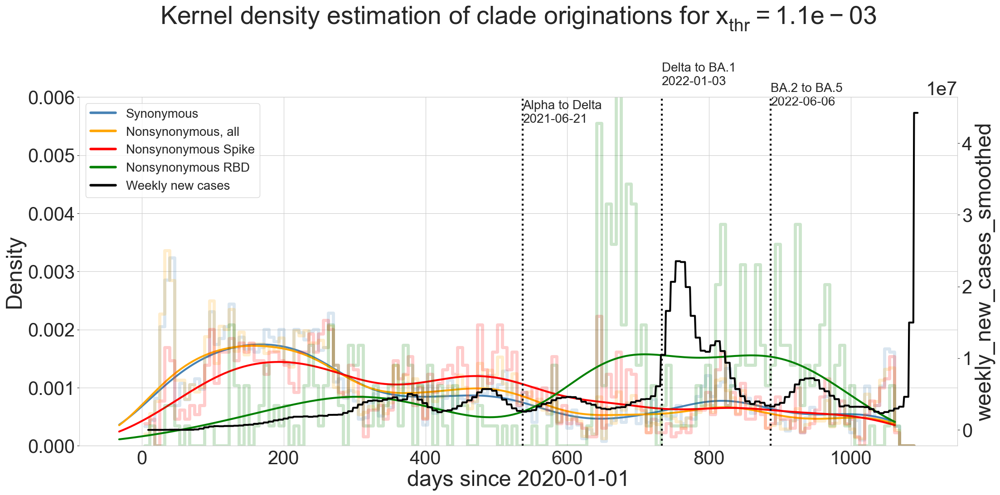

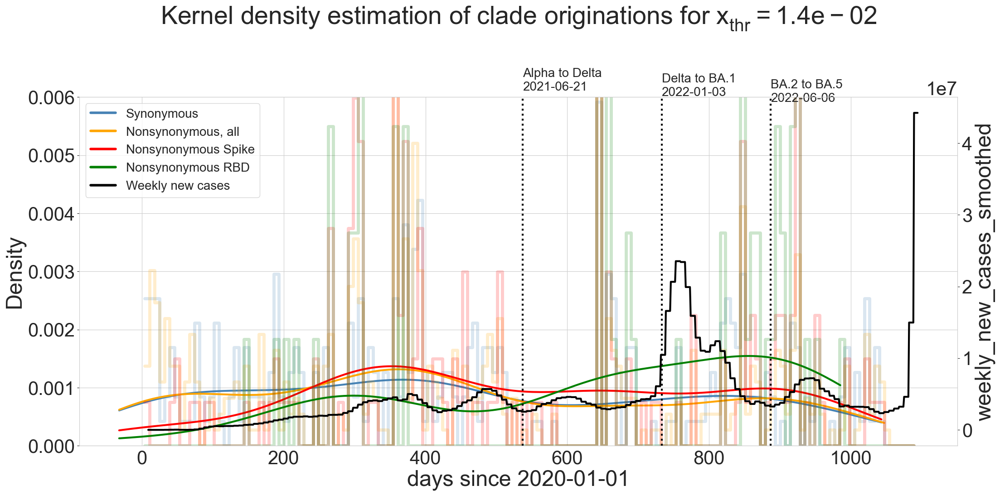

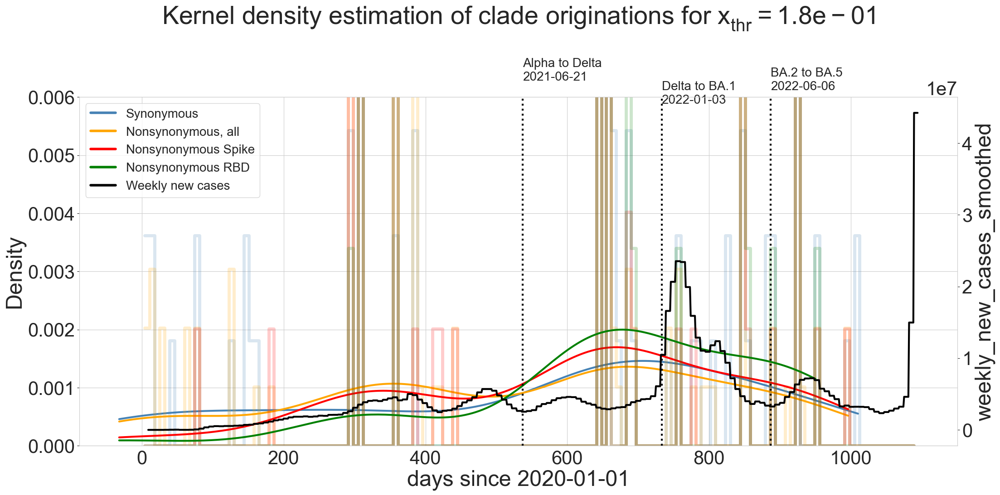

In [ ]:
fig,ax= plt.subplots(1,1,figsize=(25,10))
sns.histplot(syn_clade_stats['day_diff'], alpha= .2,label='Syn', color='steelblue',ls='-',ax=ax,lw=5, kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')
sns.histplot(nonsyn_all_clade_stats['day_diff'], alpha= .2,label='Nonsyn all',ax=ax,lw=5,ls='-', color='orange', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')
sns.histplot(nonsyn_S_clade_stats['day_diff'], alpha= .2,label='Nonsyn S',ax=ax,lw=5,ls='-', color='red', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')
sns.histplot(nonsyn_RBD_clade_stats['day_diff'], alpha= .2,label='Nonsyn RBD',ax=ax,lw=5,ls='-', color='green', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

ax.set_xlabel(f'days since {reference_date.date()}')
ax.set_title('Kernel density estimation of clade originations for $x_{thr}=0$', y= 1.2)
tax = ax.twinx()
tax.grid(False)
sns.lineplot(data = covid_data_World, x = 'day_diff', y = 'weekly_new_cases_smoothed', ax = tax ,color='black')
handles = [Line2D([0], [0], color='steelblue', lw=4, label='Synonymous'),
                Line2D([0], [0], color='orange', lw=4, label='Nonsynonymous, all'),
                Line2D([0], [0], color='red', lw=4, label='Nonsynonymous Spike'),
                Line2D([0], [0], color='green', lw=4, label='Nonsynonymous RBD'),
                Line2D([0], [0], color='black', lw=4, label='Weekly new cases')]
ax.legend(handles=handles,loc='upper left',fontsize=20)

for date,label in zip(crossover_dates,crossover_labels):
    ax.axvline((date-reference_date).days,linestyle=':',color='black')
    ax.text((date-reference_date).days,ax.get_ylim()[1]*(.99 + 0.05*np.random.randn()),label + '\n'+ f'{date.date()}',rotation=0,fontsize=20)

for xmin in xmin_vals[9::3]:
    
    fig,ax= plt.subplots(1,1,figsize=(25,10))
    sns.histplot(syn_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2,  color='steelblue',ax=ax,lw=5,ls='-',label='Syn', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

    sns.histplot(nonsyn_all_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2, color='orange',ax=ax,lw=5,ls='-',label='Nonsyn all', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

    sns.histplot(nonsyn_S_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2,  color='red',ax=ax,lw=5,ls='-',label='Nonsyn S', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

    sns.histplot(nonsyn_RBD_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2, color='green',ax=ax,lw=5,ls='-',label='Nonsyn RBD', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')
    tax = ax.twinx()
    sns.lineplot(data = covid_data_World, x = 'day_diff', y = 'weekly_new_cases_smoothed', ax = tax ,color='black')
    
    ax.set_xlabel(f'days since {reference_date.date()}')
    ax.set_title(f'Kernel density estimation of clade originations for $x_{{thr}}={xmin:.1e}$', y= 1.2)
    
    tax.grid(False)
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0],np.min((ylim[1],6e-3)))
    for date,label in zip(crossover_dates,crossover_labels):
        ax.axvline((date-reference_date).days,linestyle=':',color='black')
        ax.text((date-reference_date).days,ax.get_ylim()[1]*(.99 + 0.05*np.random.randn()),label + '\n'+ f'{date.date()}',rotation=0,fontsize=20)
    handles = [Line2D([0], [0], color='steelblue', lw=4, label='Synonymous'),
                Line2D([0], [0], color='orange', lw=4, label='Nonsynonymous, all'),
                Line2D([0], [0], color='red', lw=4, label='Nonsynonymous Spike'),
                Line2D([0], [0], color='green', lw=4, label='Nonsynonymous RBD'),
                Line2D([0], [0], color='black', lw=4, label='Weekly new cases')]
    ax.legend(handles=handles,loc='upper left',fontsize=20)

(0.0, 0.006)

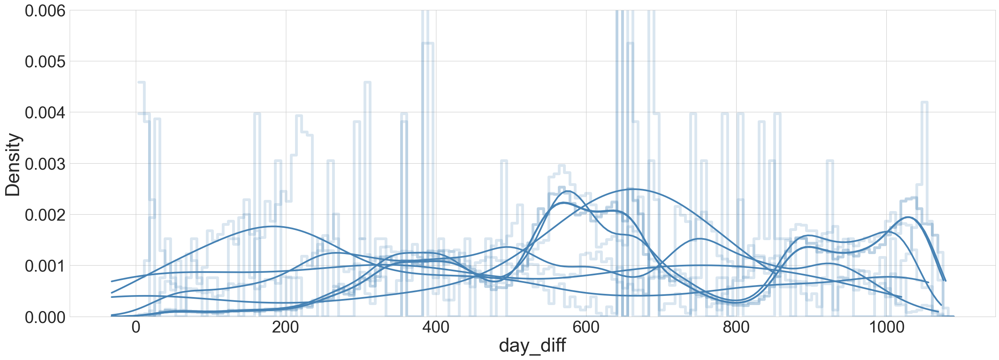

In [ ]:
fig,ax = plt.subplots(1,figsize = (30,10))
for xmin in xmin_vals[1::3]:
    sns.histplot(syn_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2,  color='steelblue',ax=ax,lw=5,ls='-',label='Syn', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

ylim = ax.get_ylim()
ax.set_ylim(ylim[0],np.min((ylim[1],6e-3)))

In [ ]:
fig,ax= plt.subplots(1,1,figsize=(25,10))
sns.histplot(syn_clade_stats['day_diff'], alpha= .2,label='Syn', color='steelblue',ls=':',ax=ax,lw=5, kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')
sns.histplot(nonsyn_all_clade_stats['day_diff'], alpha= .2,label='Nonsyn all',ax=ax,lw=5,ls='--', color='orange', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')
sns.histplot(nonsyn_S_clade_stats['day_diff'], alpha= .2,label='Nonsyn S',ax=ax,lw=5,ls='-', color='red', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')
sns.histplot(nonsyn_RBD_clade_stats['day_diff'], alpha= .2,label='Nonsyn RBD',ax=ax,lw=5,ls='-.', color='green', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

ax.set_xlabel(f'days since {reference_date.date()}')
ax.set_title('Kernel density estimation of clade originations for $x_{thr}=0$', y= 1.2)
tax = ax.twinx()
tax.grid(False)
sns.lineplot(data = covid_data_World, x = 'day_diff', y = 'weekly_new_cases_smoothed', ax = tax ,color='black')
ax.legend(loc='best')

for date,label in zip(crossover_dates,crossover_labels):
    ax.axvline((date-reference_date).days,linestyle=':',color='black')
    ax.text((date-reference_date).days,ax.get_ylim()[1]*(.99 + 0.05*np.random.randn()),label + '\n'+ f'{date.date()}',rotation=0,fontsize=20)

for xmin in xmin_vals[9::3]:
    
    fig,ax= plt.subplots(1,1,figsize=(25,10))
    sns.histplot(syn_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2,  color='steelblue',ax=ax,lw=5,ls=':',label='Syn', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

    sns.histplot(nonsyn_all_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2, color='orange',ax=ax,lw=5,ls='--',label='Nonsyn all', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

    sns.histplot(nonsyn_S_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2,  color='red',ax=ax,lw=5,ls='-',label='Nonsyn S', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')

    sns.histplot(nonsyn_RBD_clade_stats.query(f'Max_Freq > {xmin}')['day_diff'], alpha= .2, color='green',ax=ax,lw=5,ls='-.',label='Nonsyn RBD', kde= True, element = 'step',fill=False,bins = day_diff_weekly,stat = 'density')
    tax = ax.twinx()
    sns.lineplot(data = covid_data_World, x = 'day_diff', y = 'weekly_new_cases_smoothed', ax = tax ,color='black')
    ax.legend(loc='best')
    ax.set_xlabel(f'days since {reference_date.date()}')
    ax.set_title(f'Kernel density estimation of clade originations for $x_{{thr}}={xmin:.1e}$', y= 1.2)
    for date,label in zip(crossover_dates,crossover_labels):
        ax.axvline((date-reference_date).days,linestyle=':',color='black')
        ax.text((date-reference_date).days,ax.get_ylim()[1]*(.99 + 0.05*np.random.randn()),label + '\n'+ f'{date.date()}',rotation=0,fontsize=20)
    tax.grid(False)

In [ ]:
immune_classes = pd.read_csv(os.getcwd()+'/data/immune_classes.txt',sep='\t')

In [ ]:
h,b = np.histogram(syn_clade_stats['day_diff'], bins = np.sort(covid_data_World['day_diff'].unique()),density=True)

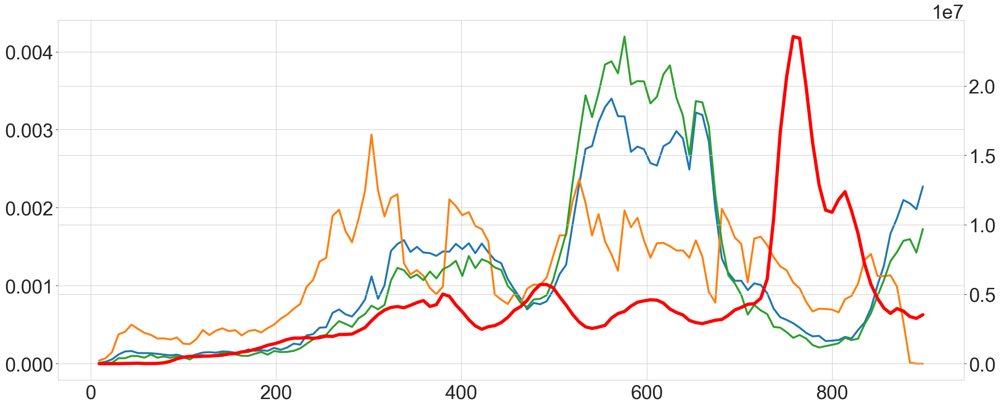

In [ ]:
fig,ax= plt.subplots(1,figsize=(25,10))
day_diff = covid_data_World['day_diff'][~np.isnan(covid_data_World['weekly_new_cases_smoothed'])][::7].values
cases = covid_data_World['weekly_new_cases_smoothed'][~np.isnan(covid_data_World['weekly_new_cases_smoothed'])][::7].values
h_syn_0,b_syn_0 = np.histogram(syn_clade_stats['day_diff'], bins = day_diff,density=True)
h_syn_1e_m4,b_syn_1e_m4 = np.histogram(nonsyn_all_clade_stats.query('Max_Freq > 1e-4')['day_diff'], bins = day_diff,density=True)

h_nnonsyn_spike_0, b_nonsyn_spike_0 = np.histogram(nonsyn_S_clade_stats['day_diff'], bins = day_diff,density=True)

day_diff = day_diff[:-1]
cases = cases[:-1]
plt.plot(b_syn_0[:-1],h_syn_0)


plt.plot(b_syn_1e_m4[:-1],h_syn_1e_m4)

plt.plot(day_diff,h_nnonsyn_spike_0)

tax = ax.twinx()
tax.plot(day_diff,cases,color='red',lw=5)

In [ ]:
fft_syn_0 = np.fft.fft(h_syn_0)
fft_cases = np.fft.fft(cases, n = len(h_syn_0))
ratio_syn_0 = fft_cases/fft_syn_0
ratio_ifft_syn_0 = np.fft.ifft(ratio_syn_0,n = len(h_syn_0))

ratio_ifft_syn_0 = np.fft.fftshift(ratio_ifft_syn_0)

fft_syn_1e_m4 = np.fft.fft(h_syn_1e_m4)
ratio_syn_1e_m4 = fft_cases/fft_syn_1e_m4

ratio_ifft_syn_1e_m4 = np.fft.ifft(ratio_syn_1e_m4,n = len(h_syn_1e_m4))


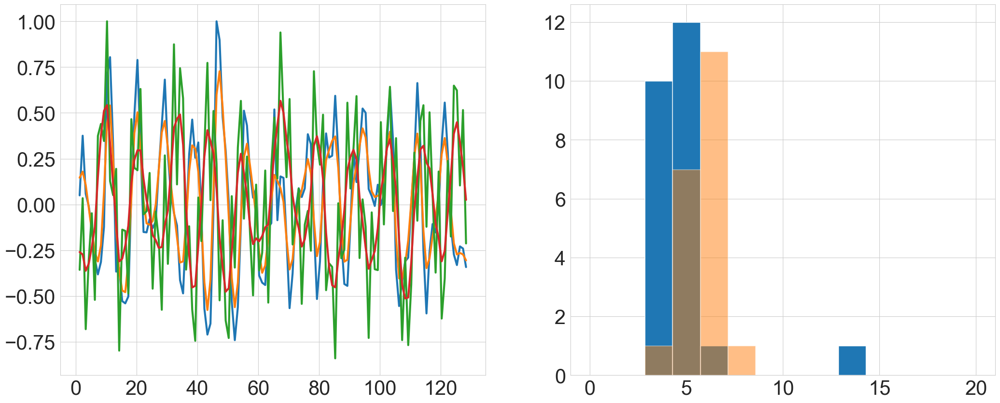

In [ ]:
# day_diff = day_diff.values
fig,ax= plt.subplots(1,2,figsize=(25,10))
norm_ratio_syn_0 = ratio_ifft_syn_0/np.max(ratio_ifft_syn_0)
smooth_norm_ratio_syn_0 = gaussian_filter1d(norm_ratio_syn_0, sigma=1)
c_syn, =ax[0].plot(day_diff/7,norm_ratio_syn_0,alpha=.5)
ax[0].plot(day_diff/7,smooth_norm_ratio_syn_0,color= c_syn.get_color())

norm_ratio_syn_1e_m4 = ratio_ifft_syn_1e_m4/np.max(ratio_ifft_syn_1e_m4)
smooth_norm_ratio_syn_1e_m4 = gaussian_filter1d(norm_ratio_syn_1e_m4, sigma=1)
ax[0].plot(day_diff/7,norm_ratio_syn_1e_m4)
ax[0].plot(day_diff/7,smooth_norm_ratio_syn_1e_m4)

#get zeros of the smoothed ratio
zero_crossings_syn_0 = np.where(np.diff(np.sign(smooth_norm_ratio_syn_0)))[0]
zero_crossings_syn_1e_m4 = np.where(np.diff(np.sign(smooth_norm_ratio_syn_1e_m4)))[0]
# day_diff[zero_crossings_syn_0[0]]/7
bins = np.linspace(0,20,15)
ax[1].hist(np.diff(day_diff[zero_crossings_syn_0]/7),bins = bins);
ax[1].hist(np.diff(day_diff[zero_crossings_syn_1e_m4]/7),bins = bins,cumulative=False,alpha=.5);

# for d in day_diff[zero_crossings_syn_0]/7:
#     ax[0].axvline(d,color='red')
    # ax[1].axvline(d,color='red')

(0.0, 898.0)

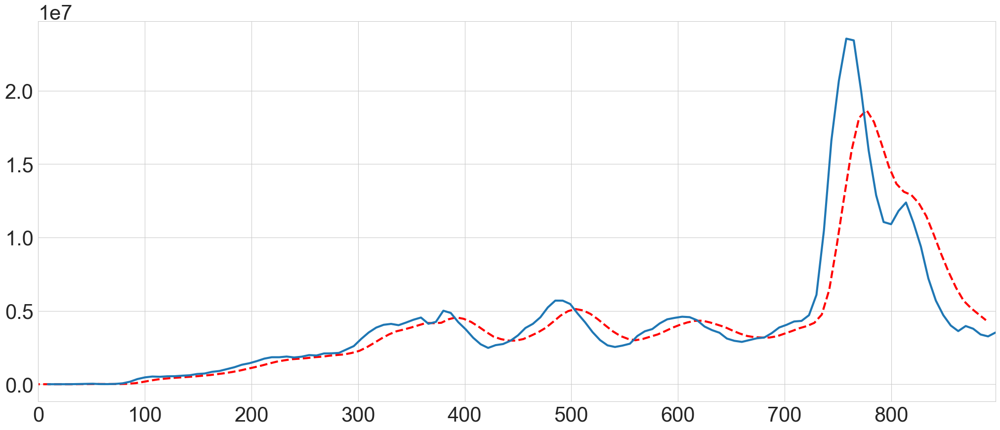

In [ ]:
#convolution of cases with an exponential kernel of rate 4
kernel = np.exp(-np.abs(day_diff)/20)
cases_conv = np.convolve(cases,kernel)/np.sum(kernel)
fig,ax= plt.subplots(1,figsize=(25,10))
day_diff_full = np.arange(-len(kernel)+1,len(kernel))*7
ax.plot(day_diff_full,np.roll(cases_conv,len(kernel)+1),ls='--',color='red')
ax.plot(day_diff,cases)
ax.set_xlim(0,day_diff[-1])

In [ ]:
cases_conv

array([43962.28361842])